#### Ski Resort Project University of Zürich 2020
## The test notebook for case6_Davos Jakobshorn_1560_ 1540-2590 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


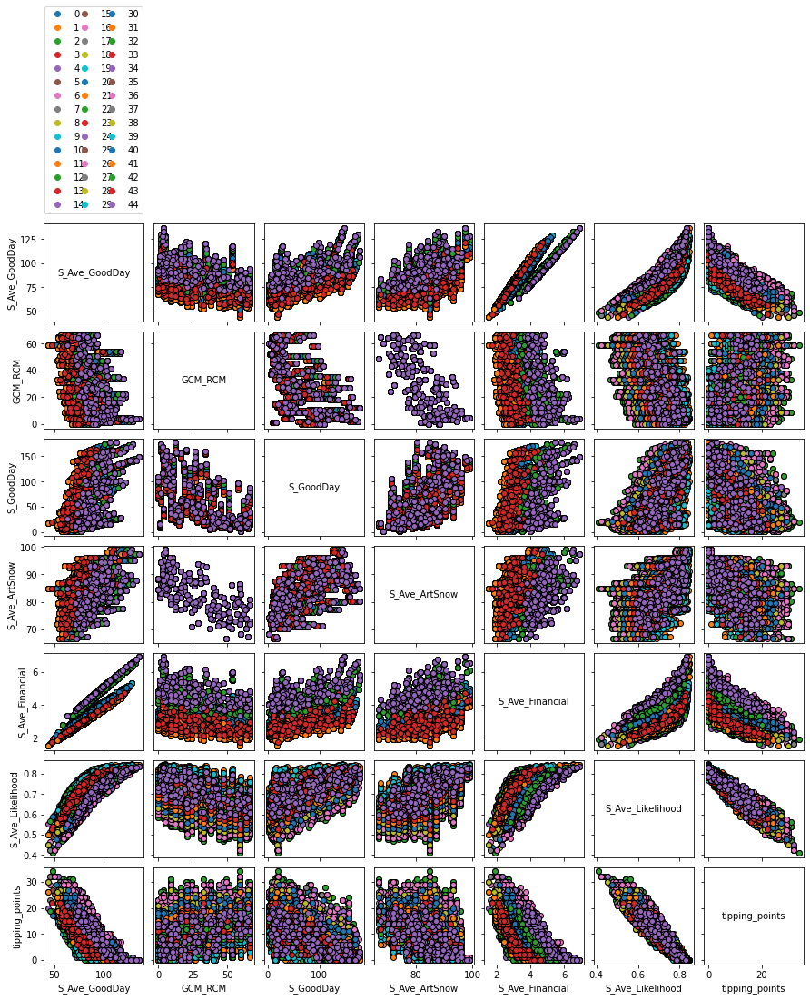

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [10]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [11]:
print(outcomes2)

{'S_Ave_GoodDay': array([ 73.26261636,  66.11374055,  80.12222849, ...,  92.08836398,
       100.20055424,  98.74468602]), 'S_GoodDay': array([[ 58.94638462,  96.56430769,  67.76130769, ...,  19.67173077,
         42.44276923,  35.20846154],
       [ 91.76576923,  86.57407692,  76.34723077, ...,  48.61515385,
         21.85165385,  29.92957692],
       [116.61588462,  98.1165    , 142.4645    , ...,  38.77015385,
          9.62315385,  92.11826923],
       ...,
       [ 97.3553    , 110.63555   , 124.9405    , ...,  69.31725   ,
         69.35075   , 100.1742    ],
       [104.40375   , 111.6174    ,  78.48385   , ...,  55.55835   ,
         55.29535   , 101.4752    ],
       [ 52.7283    , 125.6338    , 156.37405   , ...,  51.60125   ,
         58.41025   , 157.42825   ]]), 'S_Ave_ArtSnow': array([85.40805085, 70.10525424, 81.20584746, ..., 84.55364407,
       84.67135593, 81.94423729]), 'S_Ave_Financial': array([2.96847458, 2.67076271, 3.23347458, ..., 4.74813559, 5.16449153,
       

In [12]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [13]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


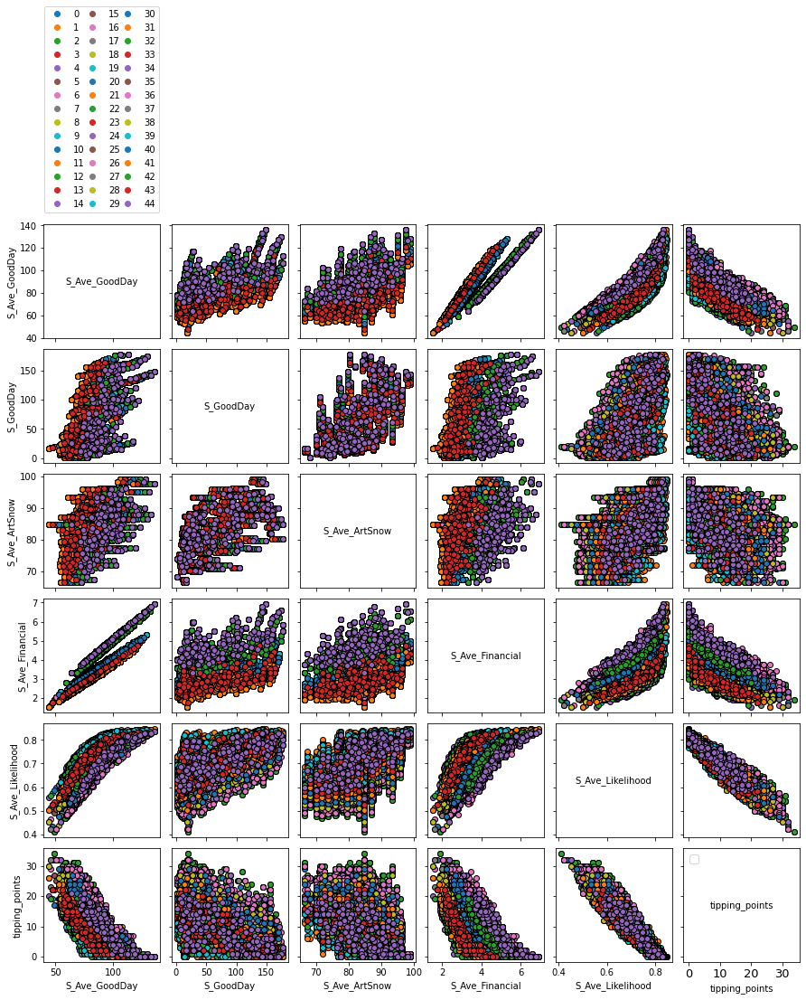

In [14]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [15]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [16]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.081102,1010.589617,4.689518,-1.669473,2.877246,0.402051,1.0,260.0,60.0,0,0,UZHModel,73.262616,4,58.946385,96.564308,67.761308,153.022692,108.180115,116.884192,70.803231,146.604500,136.761500,149.113500,98.544692,104.852885,82.081346,53.397885,63.987077,84.458231,29.385577,82.080308,35.691731,74.329231,...,43.112115,51.958654,33.068038,103.090692,108.248423,72.196385,88.432500,30.285423,36.954846,68.894769,25.174462,80.677346,23.373769,24.454308,107.394577,61.236423,19.300000,65.933808,72.315038,58.148962,41.184077,53.855154,64.467423,76.415269,67.990654,62.997885,44.008346,19.671731,42.442769,35.208462,85.408051,2.968475,0.757885,4.0
1,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,260.0,60.0,1,0,UZHModel,66.113741,37,91.765769,86.574077,76.347231,125.294346,122.818731,139.230231,124.633731,64.228923,143.137231,99.761154,106.665769,72.637577,86.568231,57.357115,103.274154,108.509923,99.088462,73.972538,80.161654,111.892923,...,37.796692,4.499115,16.362731,51.471269,62.015423,43.962808,78.623154,45.278923,58.152692,36.941577,42.713077,22.433462,25.415038,78.482192,10.410615,33.927923,24.569462,16.812538,55.367115,41.045846,37.304423,17.570423,17.967808,17.808769,13.941769,41.854462,34.170769,48.615154,21.851654,29.929577,70.105254,2.670763,0.688093,14.0
2,1.088803,1034.733220,5.811289,-1.038486,1.645246,0.699274,3.0,260.0,60.0,2,0,UZHModel,80.122228,58,116.615885,98.116500,142.464500,147.290077,155.050038,72.164962,127.140808,112.320769,162.895269,91.649308,61.857000,129.426346,149.499885,142.841346,113.015192,94.760154,110.021423,98.270077,18.757269,105.582885,...,69.950923,27.990885,62.285885,38.806231,53.156154,37.469231,88.080462,38.381962,65.438231,72.904192,49.483885,9.796577,18.049846,95.878769,49.196692,85.310192,20.977615,6.346615,4.385962,2.808846,15.668962,8.540346,33.693269,69.372500,10.353923,72.709115,22.295577,38.770154,9.623154,92.118269,81.205847,3.233475,0.726925,8.0
3,1.437167,909.668406,5.571795,-1.151397,0.803492,0.747526,3.0,260.0,60.0,3,0,UZHModel,67.512106,59,48.030923,127.054731,81.572423,83.365154,101.175423,83.021577,111.813231,125.278115,97.142538,35.916038,80.867077,79.390577,61.717731,121.471885,64.927385,114.546154,106.514500,88.299962,56.215000,97.834308,...,86.660885,46.243038,37.580885,28.578731,99.399115,89.314462,73.214462,23.546846,30.195423,32.122615,31.055577,59.711538,42.535923,27.473808,17.810962,45.944538,89.143885,31.070269,13.352077,26.857962,26.618885,34.359500,56.982385,12.448115,34.386885,91.285077,12.514269,16.626231,33.086962,23.995423,86.354237,2.750678,0.711419,10.0
4,1.500413,961.638116,4.632021,-1.811101,0.648067,0.486260,1.0,260.0,60.0,4,0,UZHModel,104.979022,5,77.724577,78.477038,137.958654,106.798423,122.255154,148.404923,84.293538,99.906885,156.933923,88.997038,140.434000,134.369923,137.806615,120.675769,102.757500,107.000692,120.434115,75.310385,93.648577,110.888192,...,138.749731,150.984615,111.213192,116.536346,134.508115,99.282538,127.220346,76.587462,92.912577,123.172769,133.863000,92.520154,98.250154,83.178462,152.916308,46.795423,129.113577,49.690962,35.490885,108.977500,86.161538,137.630769,142.349269,43.526808,146.240269,154.278692,92.085885,104.069615,124.127115,126.025846,87.916949,4.269576,0.817259,0.0


In [18]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [19]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [20]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [21]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [22]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [23]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [24]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [25]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [26]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_85_1
Money_sc_85_1
ArtSnowPossibility_sc_85_1
isOverSnow_sc_85_1


In [27]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [28]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [29]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [30]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [31]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[49.01986677]
[62.4508]
[80.94702815]
[103.90576136]
[130.56564]
(118, 1)
[1.87]
[2.47]
[3.37]
[4.51]
[5.671]
(118, 1)
[79.79]
[86.2975]
[92.395]
[101.0975]
[108.57]
(118, 1)
[60.29930571]
[77.14807711]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [32]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

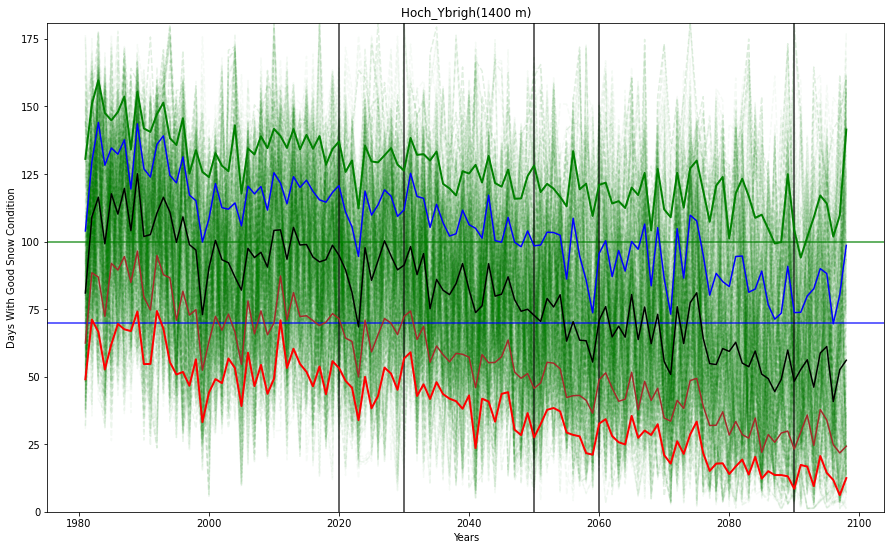

In [33]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

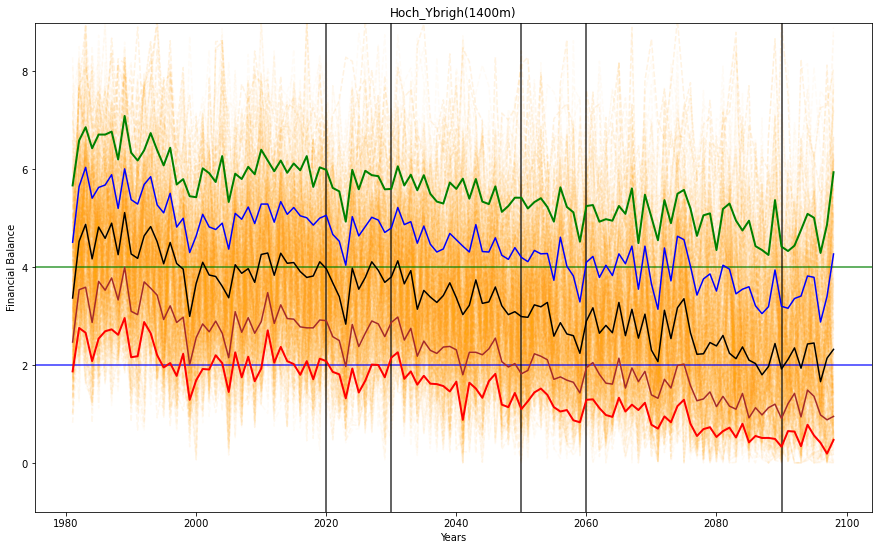

In [34]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

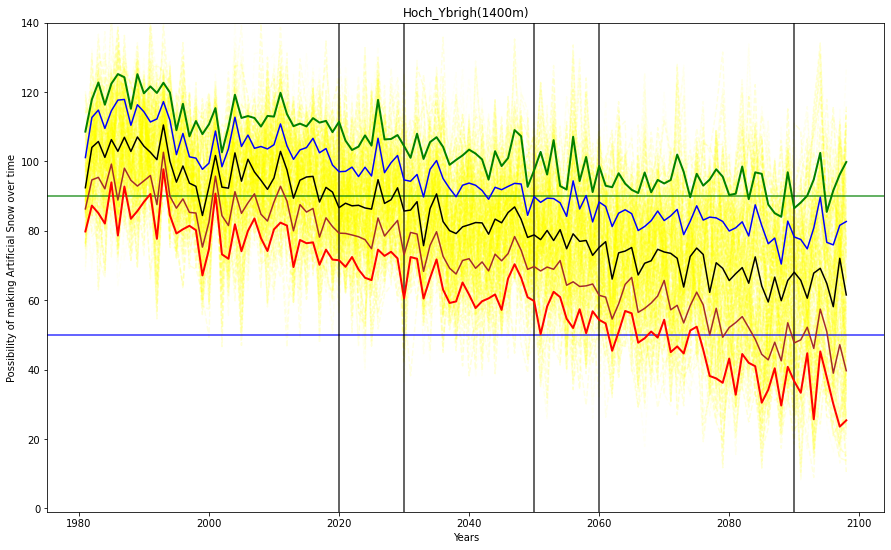

In [35]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

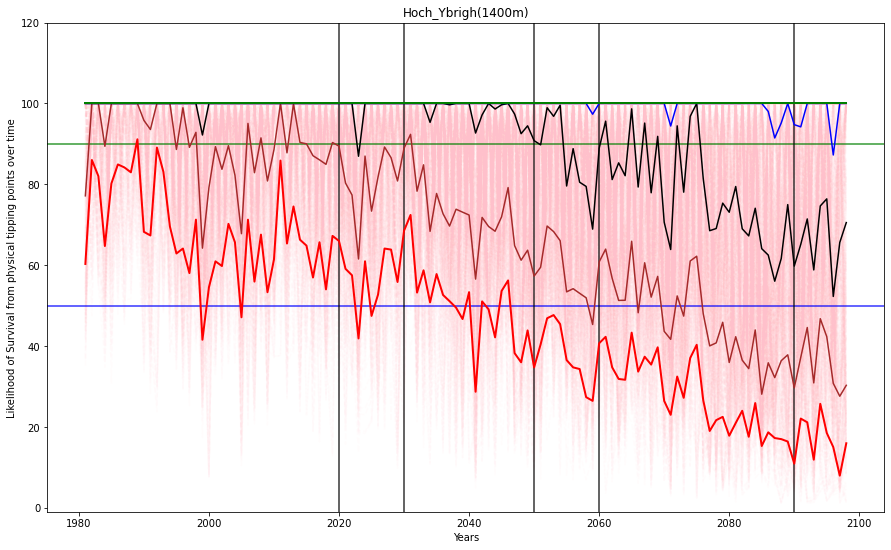

In [36]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [37]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2150 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG]

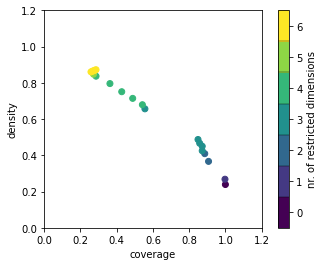

<Figure size 432x288 with 0 Axes>

In [38]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage      0.27907
density      0.869565
id                 18
mass        0.0766667
mean         0.869565
res_dim             6
Name: 18, dtype: object

                                box 18                         \
                                   min                    max   
X5temp                         4.50641                5.74639   
xClimateModel               0.00164365               0.971885   
X3iPot                         900.797                1094.64   
X6tempArt                     -1.99575               -1.05662   
xRCP                               2.5                      3   
x1SnowThershold  {280.0, 290.0, 300.0}  {280.0, 290.0, 300.0}   

                                                
                                     qp values  
X5temp            [-1.0, 3.24132403359065e-15]  
xClimateModel     [-1.0, 0.009750723275544862]  
X3iPot             [-1.0, 0.09317879659082245]  
X6tempArt          [-1.0, 0.13676723355695156]  
xRCP             [3.42892757

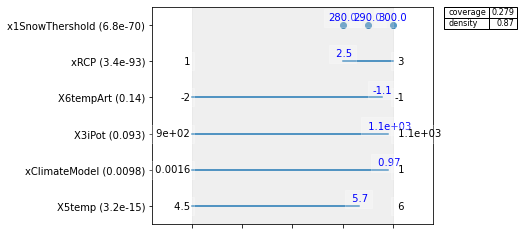

In [39]:
# Saeed : explore the inspect effect
box1.inspect(18)
box1.inspect(18, style='graph')
plt.show()

x1SnowThershold [280.0, 290.0, 300.0, 260.0, 200.0, 270.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


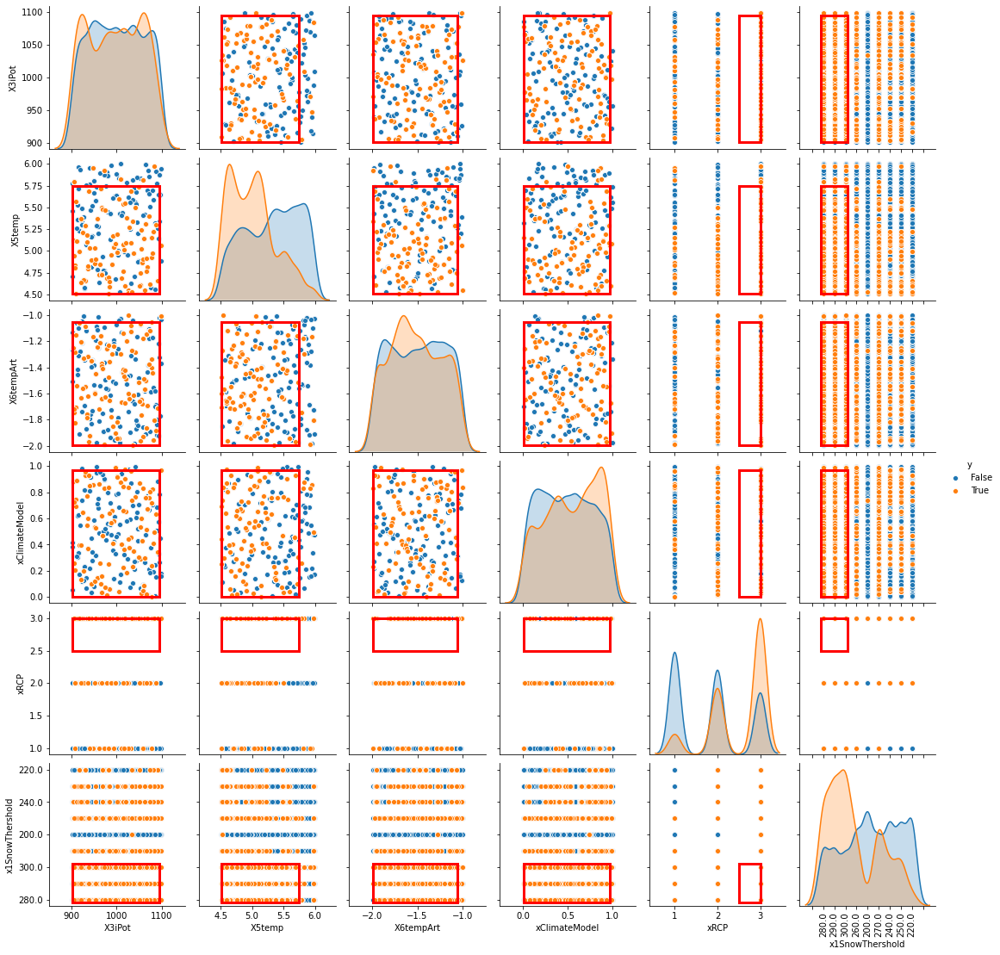

In [40]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(18)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [41]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8295 points remaining, containing 1535 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.8333333333333334, mass: 0.06333333333333334, coverage: 0.22093023255813954, density: 0.8333333333333334 restricted_dimensions: 5


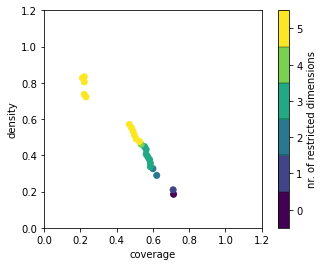

In [42]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage    0.586047
density     0.336898
id                 4
mass        0.415556
mean        0.336898
res_dim            3
Name: 4, dtype: object

                                                             box 4  \
                                                               min   
X5temp                                                     4.50641   
xRCP                                                           1.5   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0}   

                                                                    \
                                                               max   
X5temp                                                     5.94176   
xRCP                                                             3   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0}   

                                                
                                     qp values  
X5temp             [-1.0, 0.09236176962116988]  
x

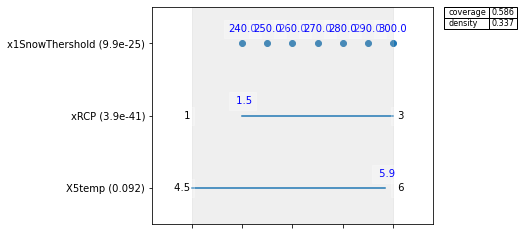

In [43]:
# Saeed : explore the inspect effect
box2.inspect(4)
box2.inspect(4, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 200.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


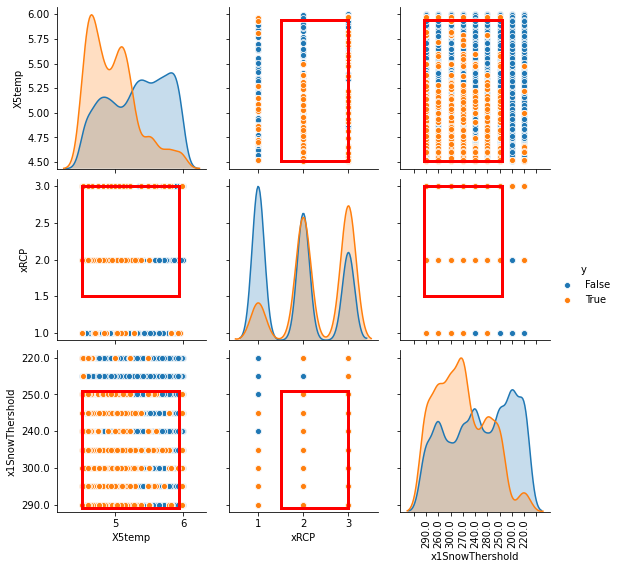

In [44]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(4)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [45]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 80
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 3240 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9166666666666666, mass: 0.24, coverage: 0.6111111111111112, density: 0.9166666666666666 restricted_dimensions: 3


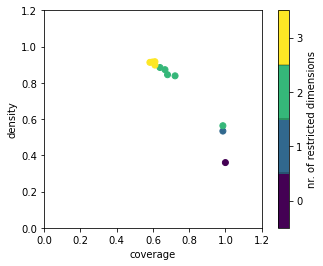

In [46]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.611111
density     0.916667
id                10
mass            0.24
mean        0.916667
res_dim            3
Name: 10, dtype: object

             box 10                                                        
                min       max                                     qp values
X6tempArt -1.995746 -1.196620                [-1.0, 1.9716152795143774e-48]
xRCP       2.500000  3.000000                                   [0.0, -1.0]
X5temp     4.536507  5.921771  [0.004619853921805938, 0.010576017574340676]



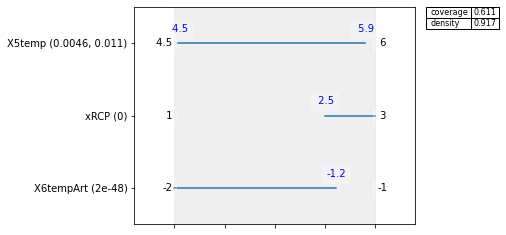

In [47]:
# Saeed : explore the inspect effect
box3.inspect(10)
box3.inspect(10, style='graph')
plt.show()

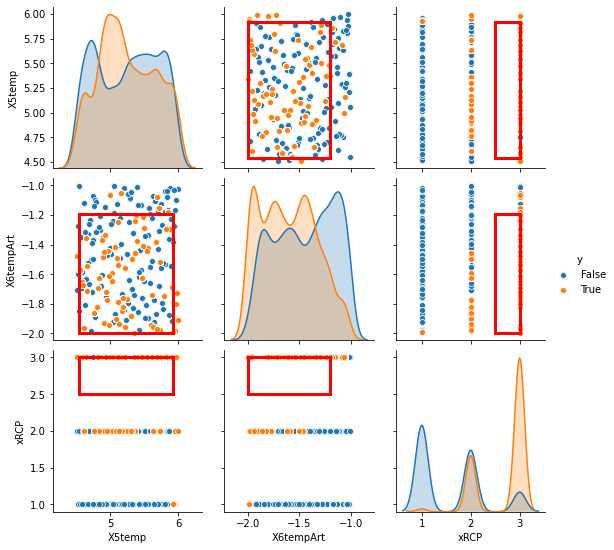

In [48]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(10)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [49]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1476 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasti

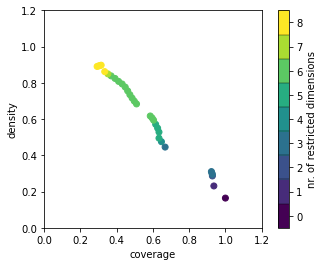

In [50]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage     0.447154
density      0.776471
id                 20
mass        0.0944444
mean         0.776471
res_dim             6
Name: 20, dtype: object

                                                            box 20  \
                                                               min   
X5temp                                                     4.50641   
xClimateModel                                           0.00164365   
xRCP                                                           2.5   
xGoodDays                                      {80.0, 90.0, 100.0}   
policy           {0, 1, 2, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, ...   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   

                                                                    \
                                                               max   
X5temp                                                     5.74639   
xClimateModel                                             0.971885   
xR

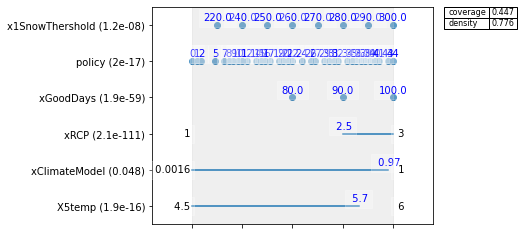

In [51]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 220.0, 200.0]
xGoodDays [80.0, 90.0, 100.0, 60.0, 70.0]
policy [0, 1, 2, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 24, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 33, 3, 4, 6, 42, 13, 18, 23, 25, 28]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


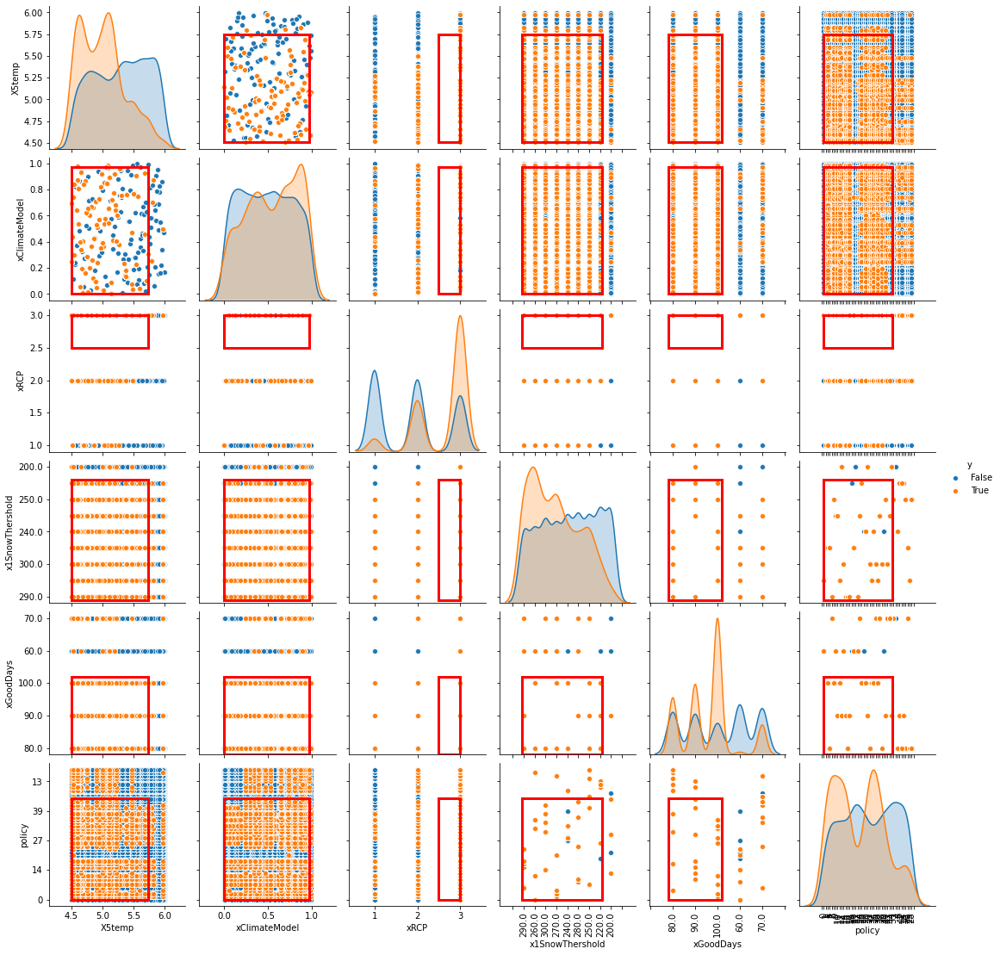

In [52]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(20)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [53]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 5911 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.133, coverage: 0.2025038064625275, density: 1.0 restricted_dimensions: 4


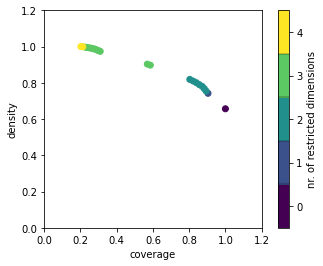

In [54]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.212993
density     0.999206
id                20
mass            0.14
mean        0.999206
res_dim            4
Name: 20, dtype: object

                                                      box 20  \
                                                         min   
xRCP                                                       1   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
policy     {0, 1, 2, 3, 4, 8, 9, 11, 12, 14, 19, 20, 21, ...   
X5temp                                               4.56884   

                                                              \
                                                         max   
xRCP                                                     1.5   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
policy     {0, 1, 2, 3, 4, 8, 9, 11, 12, 14, 19, 20, 21, ...   
X5temp                                               5.99853   

                                            
                                 q

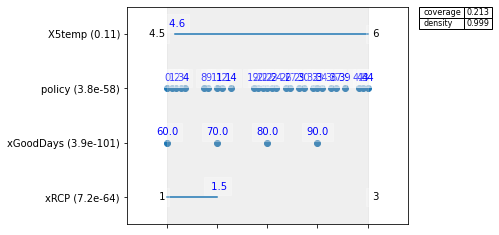

In [55]:
# Saeed : explore the inspect effect
box5.inspect(20)
box5.inspect(20, style='graph')
plt.show()

xGoodDays [70.0, 80.0, 90.0, 60.0, 100.0]
policy [0, 1, 2, 3, 4, 8, 9, 11, 12, 14, 19, 20, 21, 22, 23, 24, 26, 27, 29, 30, 32, 33, 34, 36, 37, 39, 42, 43, 44, 35, 5, 6, 7, 38, 40, 10, 41, 13, 15, 16, 17, 18, 25, 28, 31]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


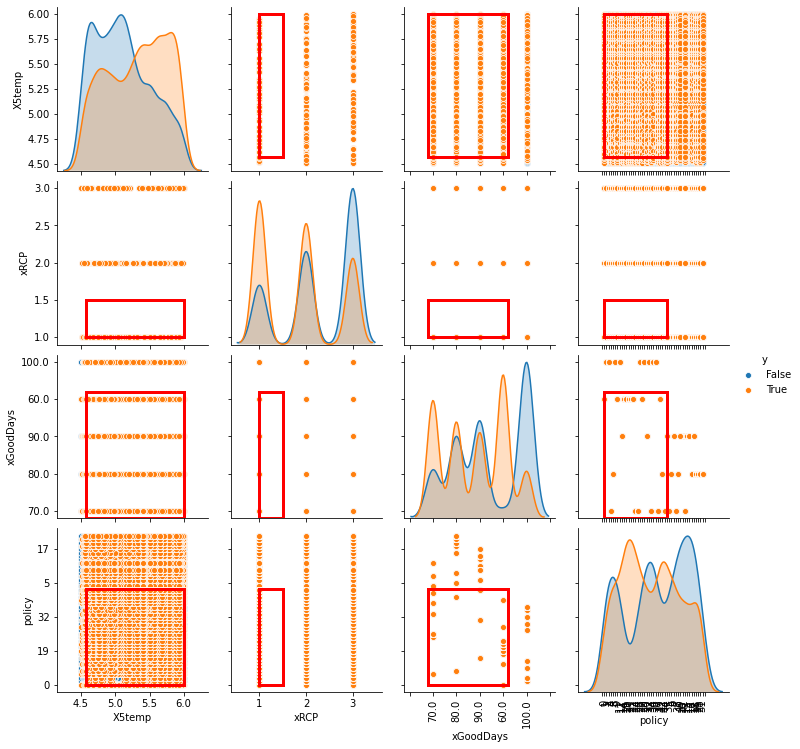

In [56]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(20)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [57]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [58]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [59]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


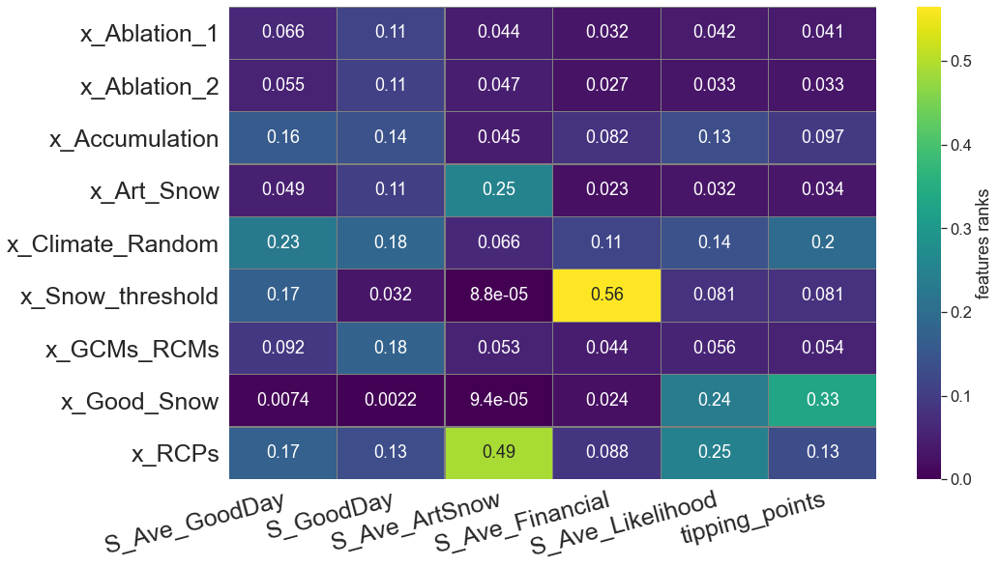

In [60]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


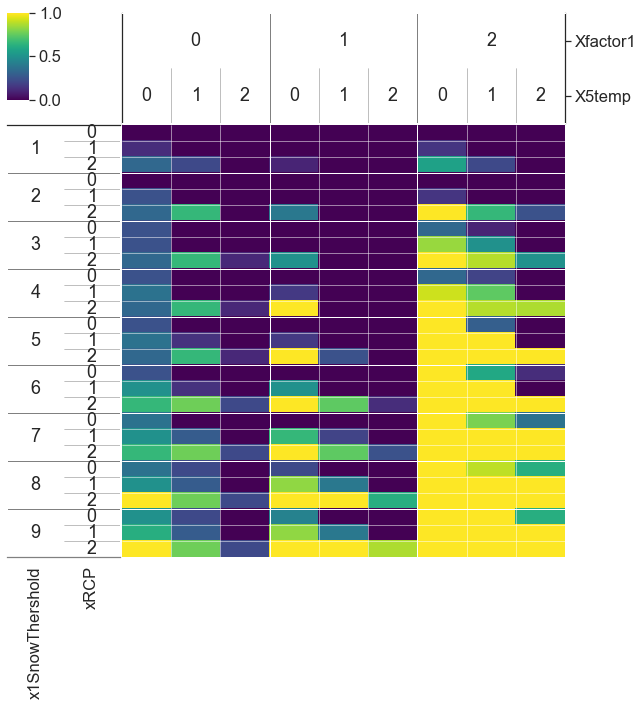

In [61]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 75
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


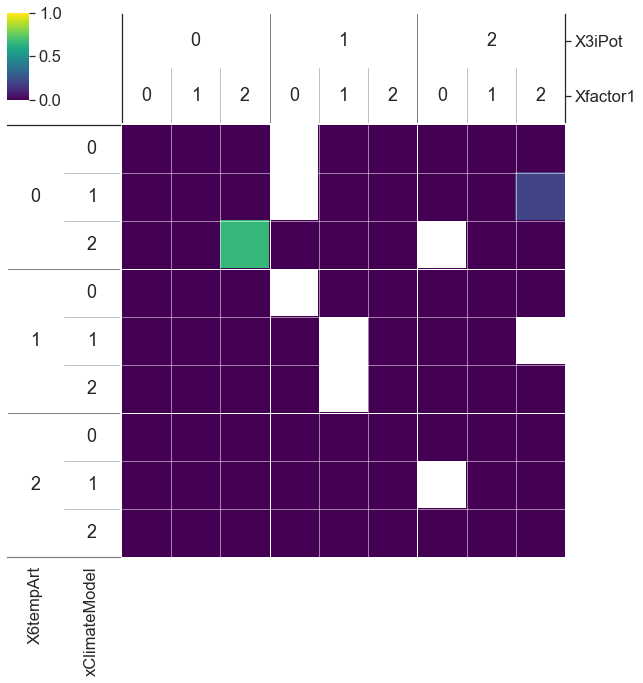

In [62]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


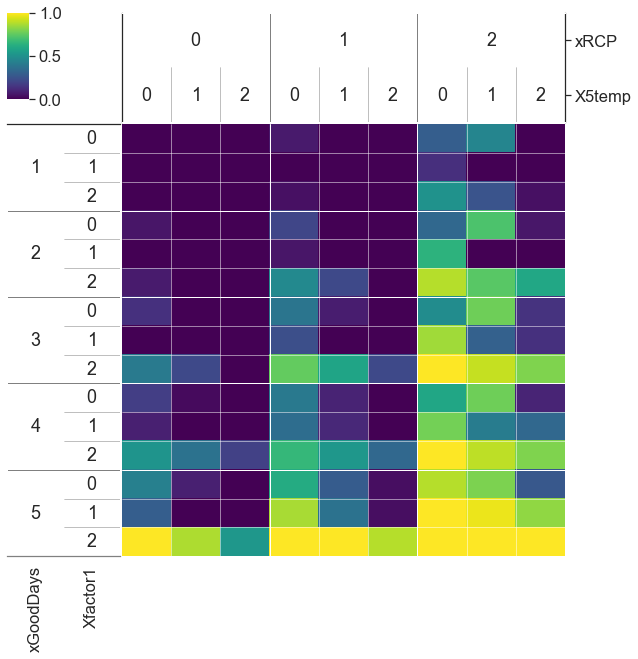

In [63]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.65
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

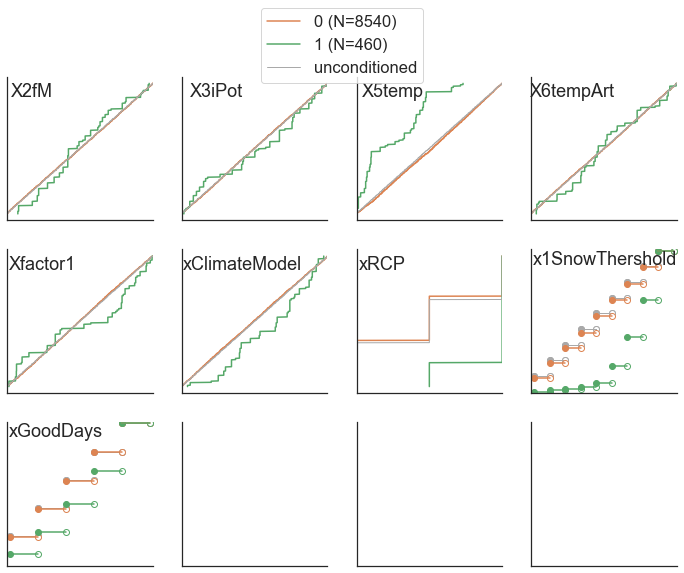

In [64]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

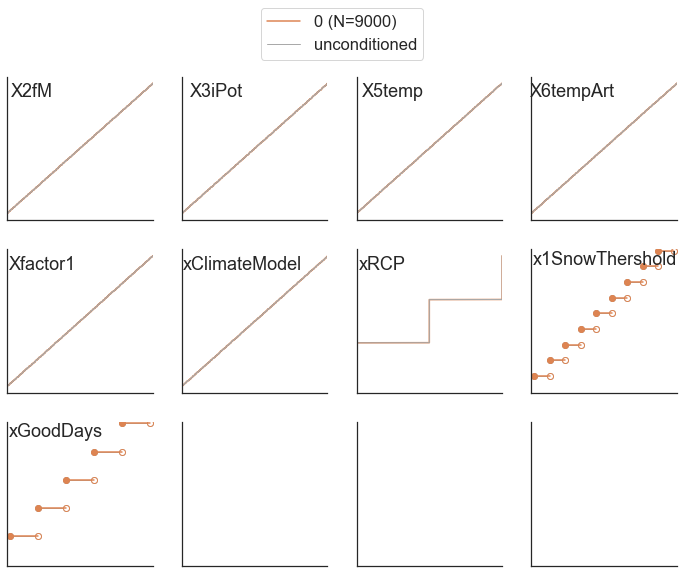

In [65]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

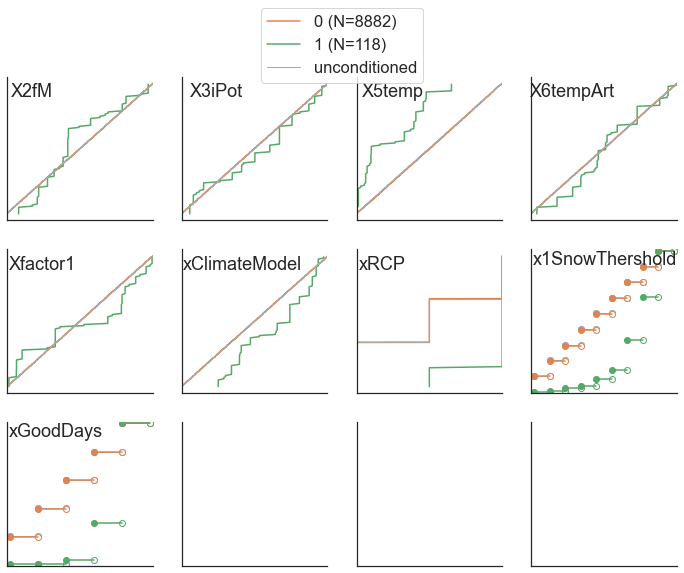

In [66]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

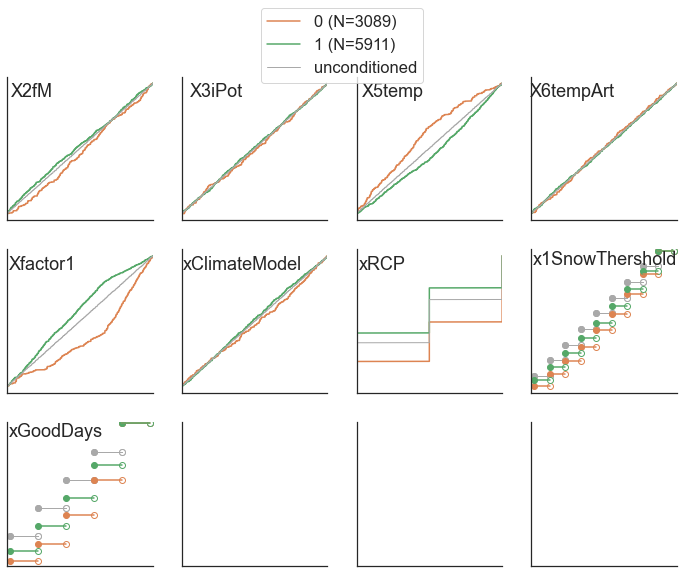

In [67]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

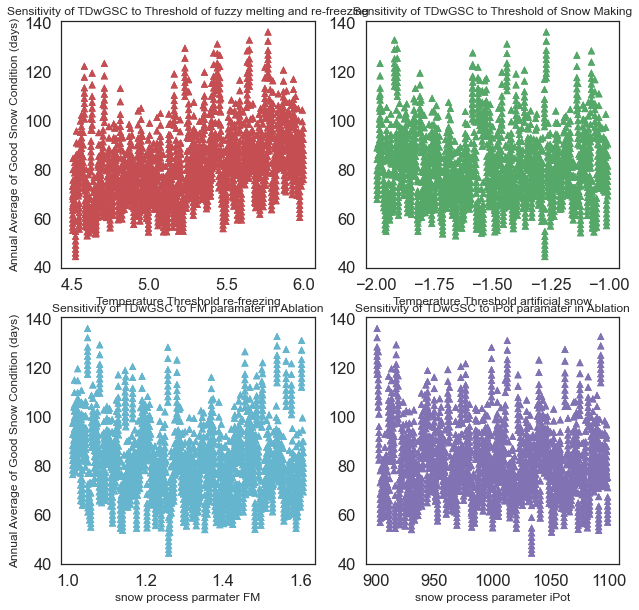

In [68]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

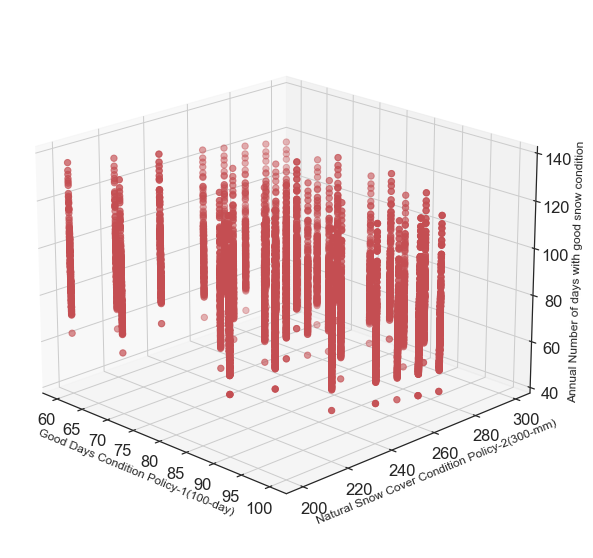

In [69]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [70]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.081102,1010.589617,4.689518,-1.669473,2.877246,0.402051,1.0,260.0,60.0,0,0,UZHModel,73.262616,4,58.946385,96.564308,67.761308,153.022692,108.180115,116.884192,70.803231,146.604500,136.761500,149.113500,98.544692,104.852885,82.081346,53.397885,63.987077,84.458231,29.385577,82.080308,35.691731,74.329231,...,43.112115,51.958654,33.068038,103.090692,108.248423,72.196385,88.432500,30.285423,36.954846,68.894769,25.174462,80.677346,23.373769,24.454308,107.394577,61.236423,19.300000,65.933808,72.315038,58.148962,41.184077,53.855154,64.467423,76.415269,67.990654,62.997885,44.008346,19.671731,42.442769,35.208462,85.408051,2.968475,0.757885,4.0
1,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,260.0,60.0,1,0,UZHModel,66.113741,37,91.765769,86.574077,76.347231,125.294346,122.818731,139.230231,124.633731,64.228923,143.137231,99.761154,106.665769,72.637577,86.568231,57.357115,103.274154,108.509923,99.088462,73.972538,80.161654,111.892923,...,37.796692,4.499115,16.362731,51.471269,62.015423,43.962808,78.623154,45.278923,58.152692,36.941577,42.713077,22.433462,25.415038,78.482192,10.410615,33.927923,24.569462,16.812538,55.367115,41.045846,37.304423,17.570423,17.967808,17.808769,13.941769,41.854462,34.170769,48.615154,21.851654,29.929577,70.105254,2.670763,0.688093,14.0
2,1.088803,1034.733220,5.811289,-1.038486,1.645246,0.699274,3.0,260.0,60.0,2,0,UZHModel,80.122228,58,116.615885,98.116500,142.464500,147.290077,155.050038,72.164962,127.140808,112.320769,162.895269,91.649308,61.857000,129.426346,149.499885,142.841346,113.015192,94.760154,110.021423,98.270077,18.757269,105.582885,...,69.950923,27.990885,62.285885,38.806231,53.156154,37.469231,88.080462,38.381962,65.438231,72.904192,49.483885,9.796577,18.049846,95.878769,49.196692,85.310192,20.977615,6.346615,4.385962,2.808846,15.668962,8.540346,33.693269,69.372500,10.353923,72.709115,22.295577,38.770154,9.623154,92.118269,81.205847,3.233475,0.726925,8.0
3,1.437167,909.668406,5.571795,-1.151397,0.803492,0.747526,3.0,260.0,60.0,3,0,UZHModel,67.512106,59,48.030923,127.054731,81.572423,83.365154,101.175423,83.021577,111.813231,125.278115,97.142538,35.916038,80.867077,79.390577,61.717731,121.471885,64.927385,114.546154,106.514500,88.299962,56.215000,97.834308,...,86.660885,46.243038,37.580885,28.578731,99.399115,89.314462,73.214462,23.546846,30.195423,32.122615,31.055577,59.711538,42.535923,27.473808,17.810962,45.944538,89.143885,31.070269,13.352077,26.857962,26.618885,34.359500,56.982385,12.448115,34.386885,91.285077,12.514269,16.626231,33.086962,23.995423,86.354237,2.750678,0.711419,10.0
4,1.500413,961.638116,4.632021,-1.811101,0.648067,0.486260,1.0,260.0,60.0,4,0,UZHModel,104.979022,5,77.724577,78.477038,137.958654,106.798423,122.255154,148.404923,84.293538,99.906885,156.933923,88.997038,140.434000,134.369923,137.806615,120.675769,102.757500,107.000692,120.434115,75.310385,93.648577,110.888192,...,138.749731,150.984615,111.213192,116.536346,134.508115,99.282538,127.220346,76.587462,92.912577,123.172769,133.863000,92.520154,98.250154,83.178462,152.916308,46.795423,129.113577,49.690962,35.490885,108.977500,86.161538,137.630769,142.349269,43.526808,146.240269,154.278692,92.085885,104.069615,124.127115,126.025846,87.916949,4.269576,0.817259,0.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [71]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.398745,937.177879,5.689562,-1.967391,2.697309,0.927143,3.0,200.0,90.0,195,44,UZHModel,83.710312,65,98.36315,141.02395,110.83455,163.73060,128.66205,135.68720,124.90850,123.52390,132.01420,106.99005,122.21295,150.77400,139.03800,109.67670,118.29180,130.11170,119.78795,114.25515,82.51830,122.66430,...,36.80720,25.57940,85.42755,54.93405,96.75420,126.03515,83.79945,47.76640,56.48285,63.64740,21.25115,18.73340,59.22155,73.40325,78.70275,25.33165,68.23570,47.80675,11.38095,20.79355,12.07900,30.12095,34.03820,60.36910,4.11095,56.31025,48.40645,25.47255,4.13140,16.49790,67.367712,4.317627,0.672592,15.0
8996,1.433285,1015.226787,4.764726,-1.142065,2.821321,0.658218,2.0,200.0,90.0,196,44,UZHModel,81.322733,27,134.98180,129.25125,124.70925,134.98215,135.40940,127.87695,119.75835,134.55655,138.04145,145.05325,134.37390,123.37455,99.72845,125.82495,108.37880,116.89905,111.35800,94.65140,82.83315,135.88785,...,140.94030,54.56160,102.90675,100.66490,68.77295,25.05145,53.37920,69.21255,62.24125,64.52920,50.22850,42.91005,70.84455,48.82810,107.42255,25.96305,12.68495,83.92155,34.96585,35.65705,73.25525,63.37945,65.37650,42.24225,29.77915,104.05830,75.18540,30.71540,63.42485,38.53420,87.107458,4.196441,0.666292,15.0
8997,1.165329,1084.746771,5.320645,-1.701312,3.378198,0.006342,1.0,200.0,90.0,197,44,UZHModel,92.088364,0,97.35530,110.63555,124.94050,153.54355,144.82235,134.94725,121.45550,124.44985,134.78215,143.97100,149.77530,128.28785,106.95025,106.65450,155.34120,109.29090,57.82595,72.62085,37.12360,112.38065,...,56.85675,102.76275,69.58465,70.86940,87.91875,98.80590,111.74895,71.32615,78.82585,55.19815,47.98270,81.78015,56.32410,105.44485,43.98975,78.17795,81.53715,79.19495,109.35545,69.71140,35.00345,86.59240,52.68450,63.89550,34.71730,21.95720,82.34135,69.31725,69.35075,100.17420,84.553644,4.748136,0.730668,14.0
8998,1.367514,1047.232750,5.201246,-1.841051,1.745289,0.518564,1.0,200.0,90.0,198,44,UZHModel,100.200554,6,104.40375,111.61740,78.48385,87.24010,113.57930,120.20915,163.86030,111.84250,157.60680,144.47560,110.37210,152.08185,145.68760,132.01775,114.43015,109.43475,124.89810,117.95545,100.56280,106.05655,...,127.64575,116.15020,129.69840,102.48335,94.76840,115.24060,115.67830,107.97185,96.32935,42.81535,86.96475,82.89825,116.50350,63.85620,96.08145,82.13655,132.26145,120.20440,104.53380,61.52645,147.51060,108.45090,93.73055,87.75400,90.00915,71.92010,98.89070,55.55835,55.29535,101.47520,84.671356,5.164492,0.770957,4.0
8999,1.275758,1058.222672,5.408606,-1.857060,1.681035,0.090039,2.0,200.0,90.0,199,44,UZHModel,98.744686,13,52.72830,125.63380,156.37405,148.32175,94.87525,122.41315,135.05955,101.99675,153.61005,124.15010,95.35880,116.53885,141.71000,101.13540,69.83595,74.10060,84.84755,75.00120,90.02275,125.58815,...,58.85630,62.95970,56.68260,127.21045,99.34560,83.58360,60.67550,111.75180,111.16830,90.47205,83.98165,93.66295,141.71210,85.39980,96.74950,90.11360,43.15425,60.91285,62.21600,105.93495,119.51175,93.26130,70.78025,88.12135,132.64800,114.71620,93.26500,51.60125,58.41025,157.42825,81.944237,5.097881,0.766035,6.0


In [72]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [73]:
x_policy[1]

260.0

In [74]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,260.0,60.0,1,0,UZHModel,66.113741,37,91.765769,86.574077,76.347231,125.294346,122.818731,139.230231,124.633731,64.228923,143.137231,99.761154,106.665769,72.637577,86.568231,57.357115,103.274154,108.509923,99.088462,73.972538,80.161654,111.892923,...,37.796692,4.499115,16.362731,51.471269,62.015423,43.962808,78.623154,45.278923,58.152692,36.941577,42.713077,22.433462,25.415038,78.482192,10.410615,33.927923,24.569462,16.812538,55.367115,41.045846,37.304423,17.570423,17.967808,17.808769,13.941769,41.854462,34.170769,48.615154,21.851654,29.929577,70.105254,2.670763,0.688093,14.0
201,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,100.0,1,1,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.108704,136.858333,121.567037,61.850074,140.879481,96.291778,104.663481,69.947296,83.362000,55.232778,100.572185,105.529852,97.306815,71.232815,77.192704,109.712630,...,36.396815,4.332481,15.756704,49.714852,59.726111,42.334556,76.797593,43.601926,55.998889,35.573370,41.131111,21.602593,24.473741,76.809370,10.025037,32.671333,23.659481,16.189852,53.316481,39.525630,35.922778,16.919667,17.302333,17.149185,13.425407,40.304296,32.905185,46.925704,21.042333,28.821074,70.105254,2.535339,0.516609,25.0
401,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,100.0,1,2,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.108704,136.858333,121.567037,61.850074,140.879481,96.291778,104.663481,69.947296,83.362000,55.232778,100.572185,105.529852,97.306815,71.232815,77.192704,109.712630,...,36.396815,4.332481,15.756704,49.714852,59.726111,42.334556,76.797593,43.601926,55.998889,35.573370,41.131111,21.602593,24.473741,76.809370,10.025037,32.671333,23.659481,16.189852,53.316481,39.525630,35.922778,16.919667,17.302333,17.149185,13.425407,40.304296,32.905185,46.925704,21.042333,28.821074,70.105254,2.535339,0.516609,25.0
601,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,200.0,70.0,1,3,UZHModel,78.127984,37,109.687700,103.190550,98.754050,138.341350,131.245750,149.892450,134.177550,83.497600,157.065700,114.395200,117.628100,94.428850,109.163000,73.627000,118.427600,119.924550,110.184600,95.194450,97.832800,122.183200,...,47.406350,5.848850,21.271550,63.293850,78.339950,57.151650,91.092300,58.028650,75.184850,48.024050,55.524800,29.163500,33.039550,86.115350,13.533800,44.106300,31.940300,21.856300,71.316250,53.359600,48.495750,22.841550,23.358150,23.151400,18.124300,54.410800,44.422000,60.912300,28.407150,38.440700,70.105254,4.039407,0.712341,11.0
801,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,240.0,80.0,1,4,UZHModel,69.849349,37,97.698875,91.599125,82.709500,129.041750,125.417708,142.453958,129.264250,69.581333,147.954042,106.476458,110.616250,78.690708,93.782250,62.095583,108.250708,113.216667,102.602375,80.136917,86.329458,116.152792,...,40.946417,4.874042,17.726292,55.202958,66.908917,47.626375,82.675083,49.052167,62.998750,40.020042,46.272500,24.302917,27.532958,81.170958,11.278167,36.755250,26.616917,18.213583,59.981042,44.466333,40.413125,19.034625,19.465125,19.292833,15.103583,45.342333,37.018333,52.338417,23.672625,32.423708,70.105254,2.967627,0.628466,17.0
1001,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,80.0,1,5,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.1

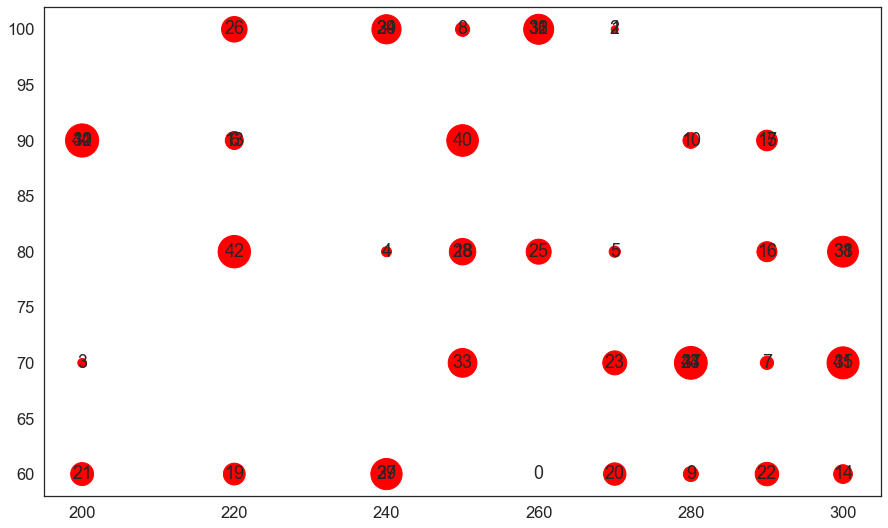

In [75]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [76]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[49.01986677]
[62.4508]
[80.94702815]
[103.90576136]
[130.56564]
(118, 1)
[1.87]
[2.47]
[3.37]
[4.51]
[5.671]
(118, 1)
[79.79]
[86.2975]
[92.395]
[101.0975]
[108.57]
(118, 1)
[60.29930571]
[77.14807711]
[100.]
[100.]
[100.]
(118, 1)


In [77]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [78]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [79]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [80]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [81]:
dfq50_26.head()

,median26
0,80.338154
1,107.711760
2,127.961833
3,93.117800
4,113.315042


In [82]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [83]:
dfAllAverages.head()

,median26,median45,median85
0,80.338154,89.242673,76.113760
1,107.711760,110.596754,109.138640
2,127.961833,113.334667,112.872385
3,93.117800,100.454407,99.918800
4,113.315042,117.483476,119.520538


In [84]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[49.01986677]
[62.4508]
[80.94702815]
[103.90576136]
[130.56564]
(118, 1)
*** RCP2.6***
[47.39670833]
[63.31875]
[80.33815385]
[95.61833333]
[112.57435]
(118, 1)
*** RCP4.5***
[49.48044]
[65.55548148]
[89.2426725]
[115.97946154]
[139.29757692]
(118, 1)
*** RCP8.5***
[49.63865517]
[59.87140741]
[76.11376]
[101.03792308]
[139.55993333]
(118, 1)


In [85]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.87]
[2.47]
[3.37]
[4.51]
[5.671]
(118, 1)
*** RCP2.6***
[1.8]
[2.52]
[3.23]
[4.18]
[5.13]
(118, 1)
*** RCP4.5***
[1.9]
[2.65]
[3.715]
[5.]
[6.04]
(118, 1)
*** RCP8.5***
[1.9]
[2.36]
[3.18]
[4.44]
[5.87]
(118, 1)


#### Set the parameters of making figure

In [86]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

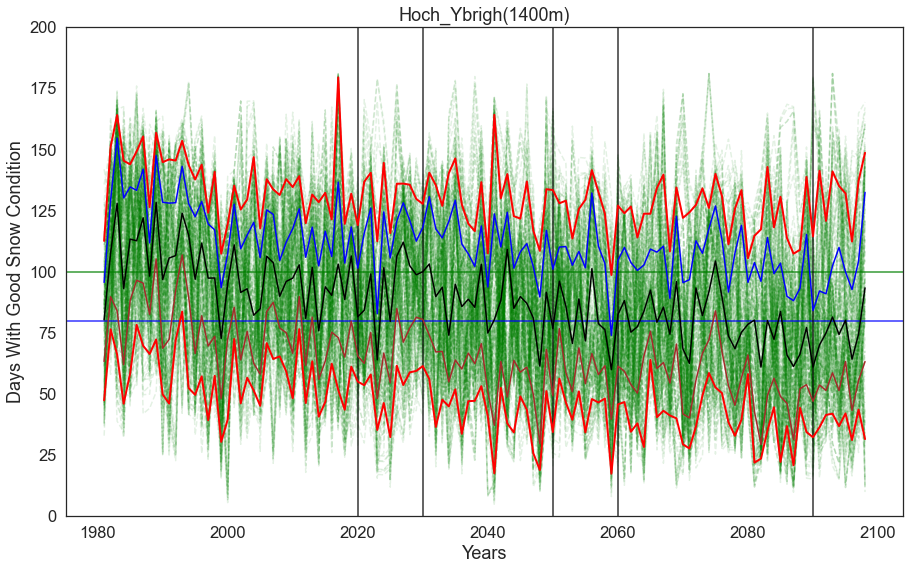

In [87]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

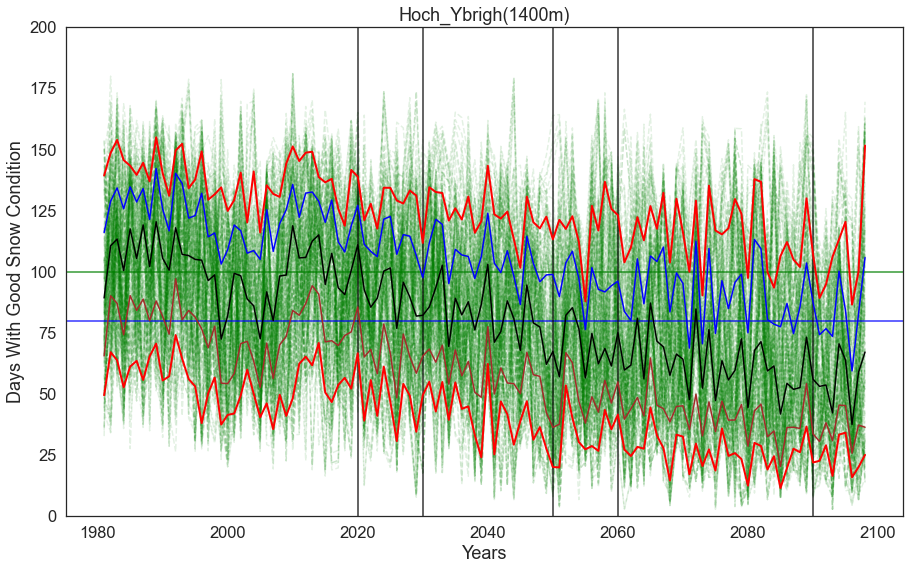

In [88]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

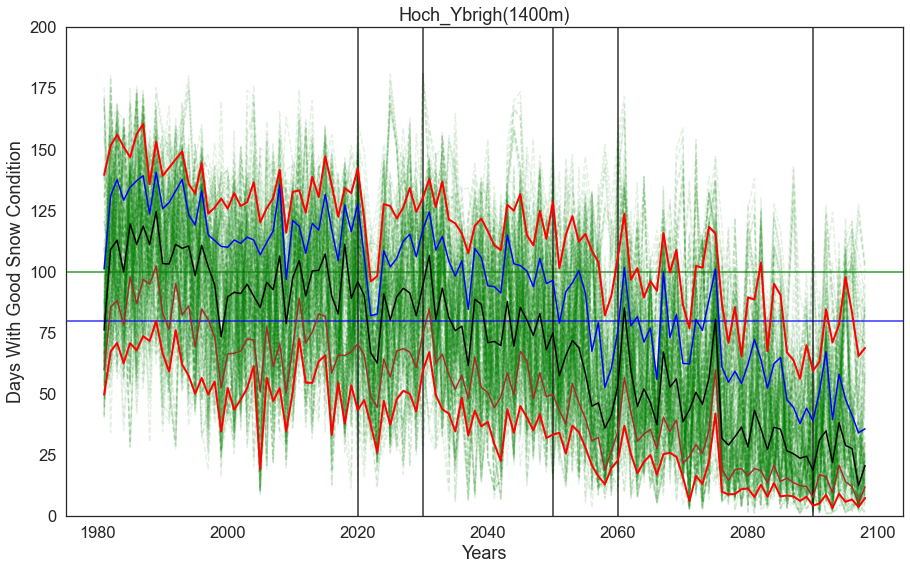

In [89]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [90]:
title_Figs = 'case6_Davos Jakobhorn, elv_b 1560m, RCP2.6'

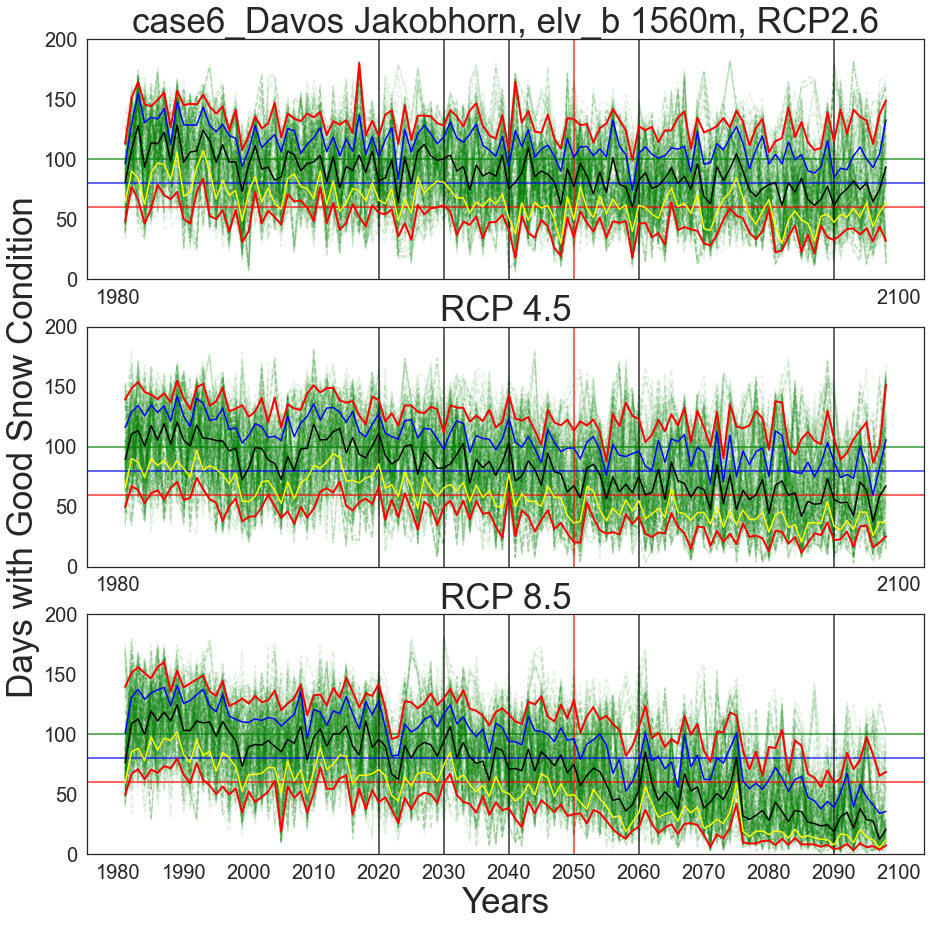

In [91]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

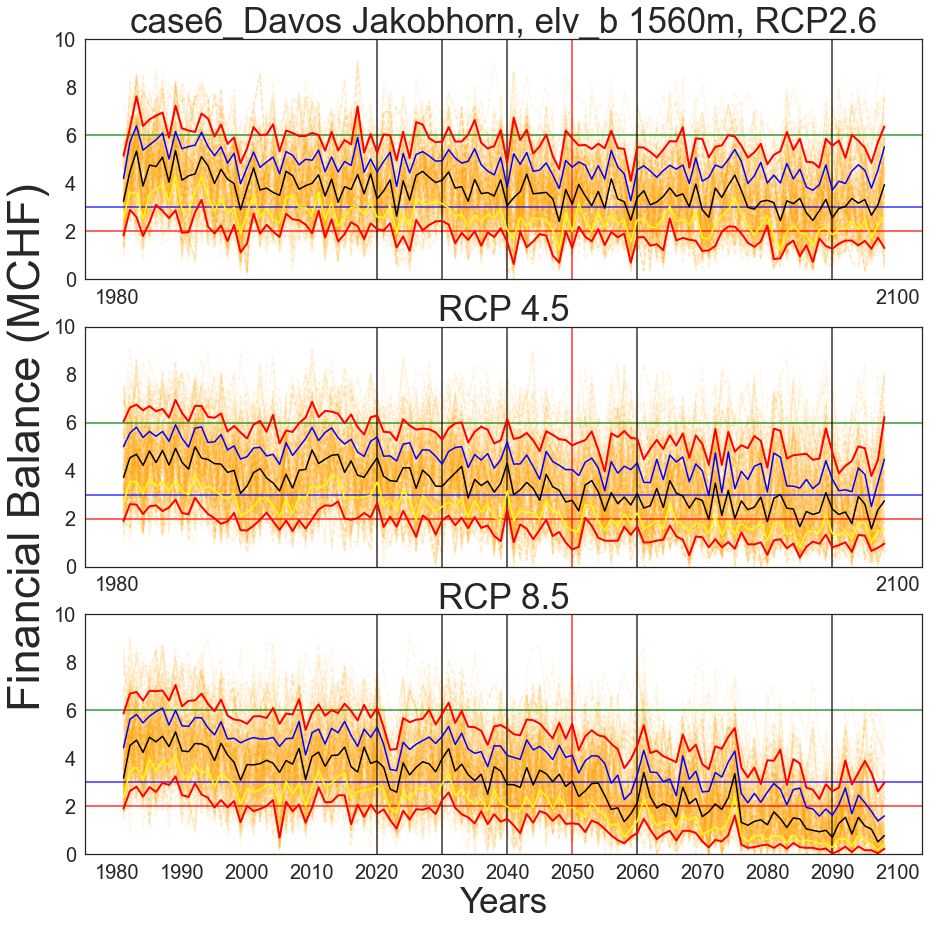

In [92]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

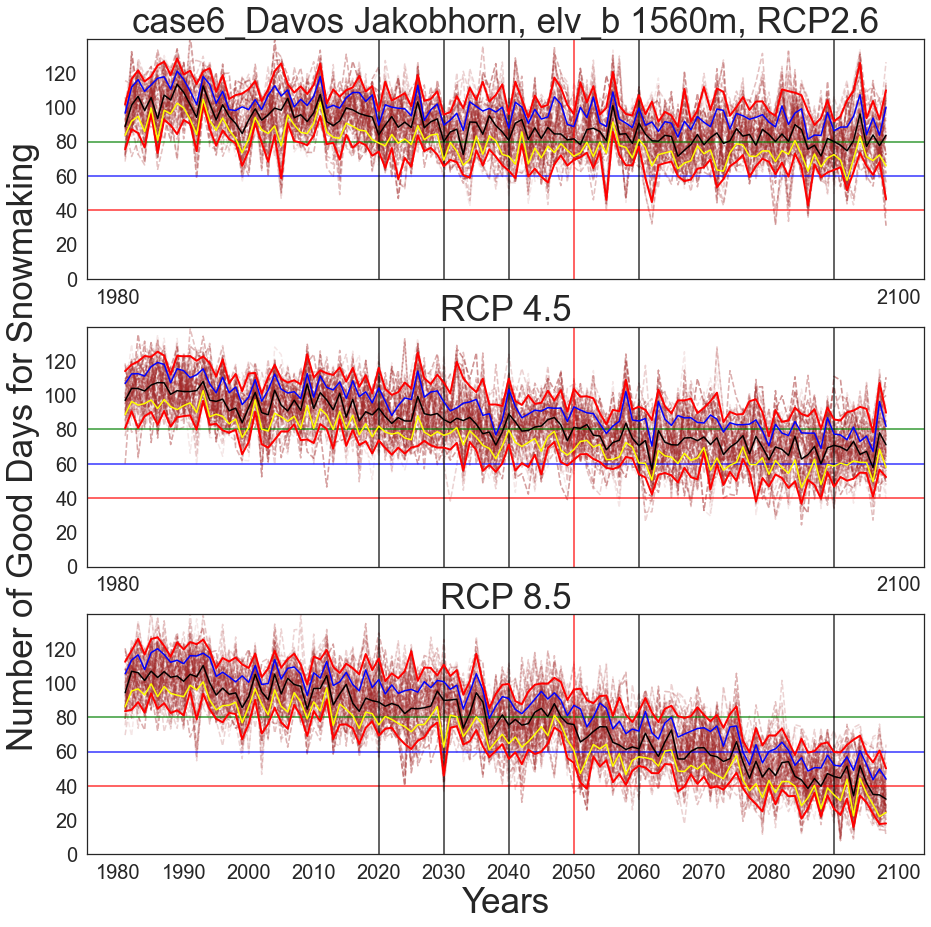

In [93]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

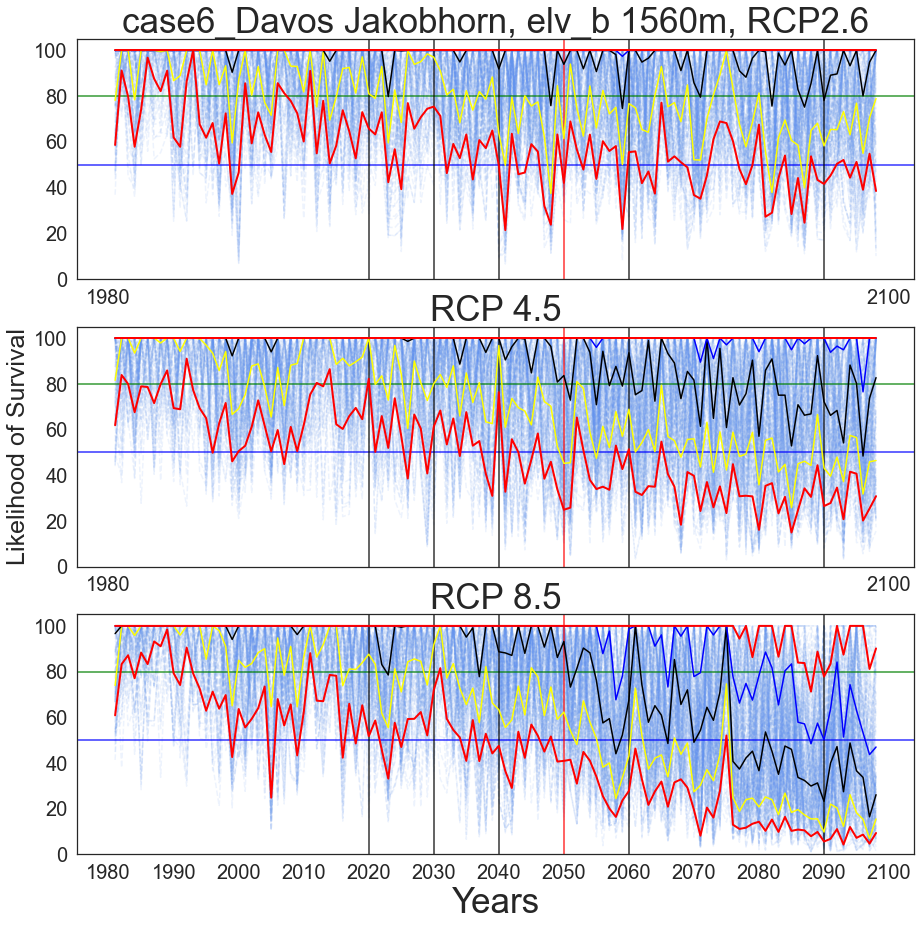

In [94]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [ ]:
dfAllAverages.head()

### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [95]:
title_Figs2 = 'Davos Jakobhorn,1560m'

In [96]:
y_axis = np.arange(1981, 2100, step= 20)

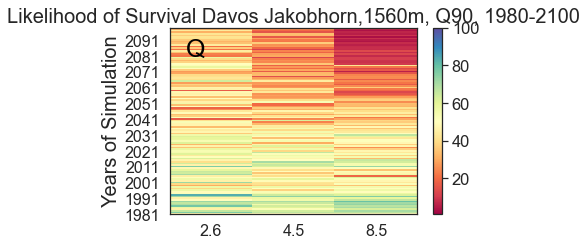

In [99]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'Q', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

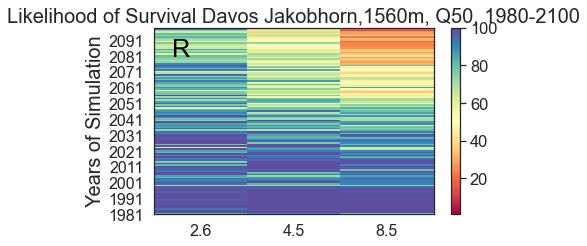

In [100]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'R', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

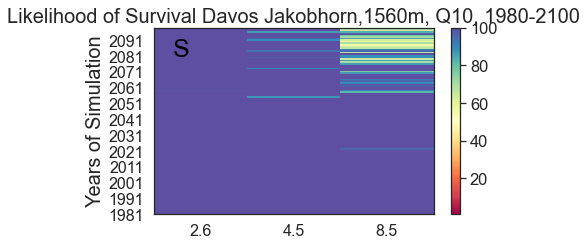

In [101]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'S', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [102]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
(9000, 119, 2)


In [103]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [104]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [105]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [106]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'], dtype='<U47')

In [107]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [108]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [109]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [110]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [111]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [112]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [113]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_5'],sc_2_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3_['Money_sc_26_5'],sc_4_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_5_['Money_sc_26_7'],sc_6_['Money_sc_26_9'],sc_7_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_8_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_9_['Money_sc_26_7'],sc_10_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_11_['Money_sc_26_7'],sc_12_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_13_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_14_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_15_['Money_sc_26_1'],sc_16_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_17_['Money_sc_26_1'],sc_18_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_19_['Money_sc_26_7'],sc_20_['Money_sc_26_4'],sc_21_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_22_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_23_['Money_sc_26_2'],sc_24_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_25_['Money_sc_26_12'],sc_26_['Money_sc_26_8'],sc_27_['Money_sc_26_8'],sc_28_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_30_['Money_sc_26_9'],sc_31_['Money_sc_26_4'],sc_32_['Money_sc_26_6'],sc_33_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2982_['Money_sc_26_5'],sc_2983_['Money_sc_26_9'],sc_2984_['Money_sc_26_10'],sc_2985_['Money_sc_26_2'],sc_2986_['Money_sc_26_8'],sc_2987_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2988_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2989_['Money_sc_26_4'],sc_2990_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['Money_sc_26_11'],sc_2992_['Money_sc_26_10'],sc_2993_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2994_['Money_sc_26_2'],sc_2995_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2996_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2997_['Money_sc_26_10'],sc_2998_['Money_sc_26_3'],sc_2999_['Money_sc_26_2'],sc_3000_['Money_sc_26_9'],sc_3001_['Money_sc_26_5'],sc_3002_['Money_sc_26_4'],sc_3003_['Money_sc_26_10'],sc_3004_['Money_sc_26_12'],sc_3005_['Money_sc_26_6'],sc_3006_['Money_sc_26_3'],sc_3007_['Money_sc_26_5'],sc_3008_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3009_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3010_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_3011_['Money_sc_26_10'],sc_3012_['Money_sc_26_5'],sc_3013_['Money_sc_26_4'],sc_3014_['Money_sc_26_1'],sc_3015_['Money_sc_26_7']
0,1981-1982,2.37,3.3100000000000027,2.0400000000000005,2.920000000000002,2.879999999999995,4.050000000000003,1.9800000000000015,4.670000000000003,2.979999999999996,3.6699999999999933,2.8399999999999976,1.7600000000000013,3.169999999999995,2.9799999999999973,3.140000000000001,3.000000000000002,2.979999999999997,3.4699999999999918,2.919999999999996,1.5700000000000012,3.679999999999993,3.5699999999999994,4.740000000000004,3.8099999999999965,2.949999999999996,3.5400000000000014,3.5800000000000023,3.730000000000003,2.9300000000000024,3.790000000000003,1.5600000000000012,3.33,1.7900000000000014,...,2.789999999999998,5.740000000000005,1.9300000000000015,5.350000000000004,4.690000000000003,2.7399999999999967,3.419999999999997,2.1599999999999997,3.3199999999999967,3.5400000000000027,2.0700000000000016,3.750000000000003,5.350000000000004,2.32,3.3200000000000025,1.8200000000000014,4.199999999999998,5.410000000000005,4.450000000000004,4.179999999999997,1.9600000000000015,3.189999999999998,4.2500000000000036,2.8099999999999987,4.149999999999999,4.04,3.3300000000000027,4.240000000000005,2.9999999999999982,2.0600000000000014,2.849999999999997,3.2399999999999998,3.730000000000003,4.130000000000003
1,1982-1983,4.0199999999999925,3.6099999999999945,3.5399999999999943,2.9199999999999973,4.700000000000004,4.2299999999999995,4.2100000000000035,2.7900000000000005,3.3699999999999934,4.390000000000003,3.3599999999999937,3.8999999999999972,5.610000000000005,3.1400000000000023,3.0399999999999943,6.190000000000005,2.959999999999995,3.9399999999999973,3.3599999999999937,5.770000000000002,4.35,5.060000000000004,3.810000000000003,4.9200000000000035,4.370000000000003,4.41999999

In [114]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [115]:
df45_all_fin.head(7)

,Season,sc_1_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_4_['Money_sc_45_2'],sc_5_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_6_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_7_['Money_sc_45_12'],sc_8_['Money_sc_45_12'],sc_9_['Money_sc_45_8'],sc_10_['Money_sc_45_5'],sc_11_['Money_sc_45_1'],sc_12_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_13_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_14_['Money_sc_45_1'],sc_15_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_16_['Money_sc_45_12'],sc_17_['Money_sc_45_20'],sc_18_['Money_sc_45_19'],sc_19_['Money_sc_45_17'],sc_20_['Money_sc_45_7'],sc_21_['Money_sc_45_13'],sc_22_['Money_sc_45_11'],sc_23_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_24_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_25_['Money_sc_45_15'],sc_26_['Money_sc_45_14'],sc_27_['Money_sc_45_10'],sc_28_['Money_sc_45_14'],sc_29_['Money_sc_45_5'],sc_30_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_31_['Money_sc_45_6'],sc_32_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_33_['Money_sc_45_24'],...,sc_2937_['Money_sc_45_16'],sc_2938_['Money_sc_45_2'],sc_2939_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2940_['Money_sc_45_2'],sc_2941_['Money_sc_45_25'],sc_2942_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2943_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2944_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2945_['Money_sc_45_19'],sc_2946_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2947_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_2948_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2949_['Money_sc_45_4'],sc_2950_['Money_sc_45_5'],sc_2951_['Money_sc_45_10'],sc_2952_['Money_sc_45_3'],sc_2953_['Money_sc_45_9'],sc_2954_['Money_sc_45_22'],sc_2955_['Money_sc_45_5'],sc_2956_['Money_sc_45_20'],sc_2957_['Money_sc_45_18'],sc_2958_['Money_sc_45_21'],sc_2959_['Money_sc_45_8'],sc_2960_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_2961_['Money_sc_45_8'],sc_2962_['Money_sc_45_1'],sc_2963_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2964_['Money_sc_45_11'],sc_2965_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2966_['Money_sc_45_1'],sc_2967_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2968_['Money_sc_45_5'],sc_2969_['Money_sc_45_16'],sc_2970_['Money_sc_45_2']
0,1981-1982,5.2600000000000104,4.620000000000003,1.6400000000000012,1.7000000000000013,4.730000000000004,2.6499999999999995,1.7500000000000013,1.8000000000000014,5.650000000000004,4.5000000000000036,3.820000000000003,4.120000000000001,5.430000000000007,4.0500000000000025,4.610000000000004,1.8000000000000014,2.389999999999998,4.589999999999992,5.000000000000004,3.0699999999999994,1.9700000000000015,5.570000000000006,5.470000000000006,2.7099999999999986,2.1100000000000008,4.220000000000003,4.770000000000005,2.4100000000000006,2.3600000000000017,3.559999999999999,2.650000000000001,1.300000000000001,2.8299999999999965,...,6.839999999999991,2.750000000000001,4.610000000000004,2.1899999999999986,6.0800000000000045,4.220000000000003,5.300000000000005,4.560000000000003,2.6499999999999995,3.0700000000000025,4.419999999999994,6.100000000000005,3.6899999999999995,3.399999999999998,4.44999999999999,4.249999999999996,3.5199999999999956,4.520000000000003,4.900000000000004,2.42,5.049999999999996,2.979999999999998,5.970000000000004,2.520000000000001,6.290000000000005,3.1400000000000015,4.2500000000000036,5.920000000000005,2.980000000000002,4.270000000000003,4.400000000000003,3.6200000000000028,5.230000000000001,1.8000000000000014
1,1982-1983,6.290000000000005,6.260000000000005,5.850000000000004,4.660000000000003,4.749999999999992,3.180000000000002,3.7400000000000007,3.760000000000001,2.8199999999999976,5.250000000000004,4.330000000000003,2.32,3.039999999999995,5.200000000000004,4.54,3.760000000000001,2.28,3.979999999999999,3.0699999999999945,4.989999999999998,3.5699999999999914,3.650000000000003,3.2899999999999987,5.590000000000004,4.050000000000003,4.359999999999997,4.540000000000004,4.410000000000005,4.

In [116]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [117]:
df85_all_fin.head(7)

,Season,sc_1_['Money_sc_85_1'],sc_2_['Money_sc_85_1'],sc_3_['Money_sc_85_22'],sc_4_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_5_['Money_sc_85_9'],sc_6_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_7_['Money_sc_85_21'],sc_8_['Money_sc_85_26'],sc_9_['Money_sc_85_4'],sc_10_['Money_sc_85_5'],sc_11_['Money_sc_85_24'],sc_12_['Money_sc_85_29'],sc_13_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_14_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_15_['Money_sc_85_30'],sc_16_['Money_sc_85_15'],sc_17_['Money_sc_85_11'],sc_18_['Money_sc_85_3'],sc_19_['Money_sc_85_24'],sc_20_['Money_sc_85_5'],sc_21_['Money_sc_85_20'],sc_22_['Money_sc_85_14'],sc_23_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP85-pcp'],sc_24_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_25_['Money_sc_85_8'],sc_26_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_27_['Money_sc_85_24'],sc_28_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_29_['Money_sc_85_9'],sc_30_['Money_sc_85_29'],sc_31_['Money_sc_85_30'],sc_32_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_33_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],...,sc_2982_['Money_sc_85_4'],sc_2983_['Money_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2984_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2985_['Money_sc_85_21'],sc_2986_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2987_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2988_['Money_sc_85_7'],sc_2989_['Money_sc_85_13'],sc_2990_['Money_sc_85_30'],sc_2991_['Money_sc_85_3'],sc_2992_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2993_['Money_sc_85_12'],sc_2994_['Money_sc_85_24'],sc_2995_['Money_sc_85_15'],sc_2996_['Money_sc_85_8'],sc_2997_['Money_sc_85_26'],sc_2998_['Money_sc_85_1'],sc_2999_['Money_sc_85_30'],sc_3000_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3001_['Money_sc_85_17'],sc_3002_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3003_['Money_sc_85_7'],sc_3004_['Money_sc_85_15'],sc_3005_['Money_sc_85_2'],sc_3006_['Money_sc_85_2'],sc_3007_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3008_['Money_sc_85_16'],sc_3009_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_3010_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3011_['Money_sc_85_28'],sc_3012_['Money_sc_85_11'],sc_3013_['Money_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_3014_['Money_sc_85_23'],sc_3015_['Money_sc_85_29']
0,1981-1982,3.8200000000000003,3.6400000000000006,4.610000000000004,1.8800000000000014,2.7699999999999965,1.9000000000000015,3.889999999999993,2.499999999999999,2.2100000000000013,5.700000000000005,3.410000000000001,2.2699999999999974,3.830000000000003,2.869999999999994,1.440000000000001,2.47,2.6099999999999977,3.7100000000000013,3.2199999999999993,5.700000000000005,3.479999999999999,2.5699999999999985,2.980000000000002,2.5799999999999996,6.960000000000005,4.390000000000005,2.879999999999998,4.510000000000004,4.799999999999987,1.8300000000000014,2.0600000000000005,2.2499999999999987,2.7699999999999947,...,2.37,4.690000000000003,3.490000000000003,4.689999999999999,2.1799999999999993,6.090000000000004,2.780000000000001,5.460000000000002,2.190000000000001,5.2900000000000045,2.6699999999999946,3.2400000000000007,3.6400000000000015,6.220000000000005,6.840000000000005,3.379999999999999,3.299999999999999,2.8199999999999963,2.21,2.989999999999999,2.889999999999999,3.6900000000000004,6.730000000000006,3.259999999999998,3.7699999999999996,4.03,2.1300000000000003,3.490000000000003,4.080000000000003,1.9100000000000015,2.4099999999999997,4.09,3.19,3.6300000000000026
1,1982-1983,3.520000000000002,3.220000000000002,3.769999999999998,5.040000000000004,2.9599999999999973,2.64,3.409999999999996,6.790000000000005,5.730000000000005,4.300000000000003,4.770000000000004,4.650000000000002,5.270000000000004,3.9099999999999957,5.5400000000000045,4.1300000000000034,3.4699999999999926,2.2300000000000018,4.839999999999997,4.300000000000003,6.230000000000005,6.090000000000004,6.180000000000004,4.9900000000000055,3.630000000000003,5.559999999999999,4.839999999999997,5.769999999999999,5.960000000000005,2.319999999999999,2.639999999999997,4.310000000000003,3

In [118]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [119]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_5'],sc_2_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3_['ArtSnowPossibility_sc_26_5'],sc_4_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_5_['ArtSnowPossibility_sc_26_7'],sc_6_['ArtSnowPossibility_sc_26_9'],sc_7_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_8_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_9_['ArtSnowPossibility_sc_26_7'],sc_10_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_11_['ArtSnowPossibility_sc_26_7'],sc_12_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_13_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_14_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_15_['ArtSnowPossibility_sc_26_1'],sc_16_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_17_['ArtSnowPossibility_sc_26_1'],sc_18_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_19_['ArtSnowPossibility_sc_26_7'],sc_20_['ArtSnowPossibility_sc_26_4'],sc_21_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_23_['ArtSnowPossibility_sc_26_2'],sc_24_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_25_['ArtSnowPossibility_sc_26_12'],sc_26_['ArtSnowPossibility_sc_26_8'],sc_27_['ArtSnowPossibility_sc_26_8'],sc_28_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_30_['ArtSnowPossibility_sc_26_9'],sc_31_['ArtSnowPossibility_sc_26_4'],sc_32_['ArtSnowPossibility_sc_26_6'],sc_33_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2982_['ArtSnowPossibility_sc_26_5'],sc_2983_['ArtSnowPossibility_sc_26_9'],sc_2984_['ArtSnowPossibility_sc_26_10'],sc_2985_['ArtSnowPossibility_sc_26_2'],sc_2986_['ArtSnowPossibility_sc_26_8'],sc_2987_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2988_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2989_['ArtSnowPossibility_sc_26_4'],sc_2990_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['ArtSnowPossibility_sc_26_11'],sc_2992_['ArtSnowPossibility_sc_26_10'],sc_2993_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2994_['ArtSnowPossibility_sc_26_2'],sc_2995_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2996_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2997_['ArtSnowPossibility_sc_26_10'],sc_2998_['ArtSnowPossibility_sc_26_3'],sc_2999_['ArtSnowPossibility_sc_26_2'],sc_3000_['ArtSnowPossibility_sc_26_9'],sc_3001_['ArtSnowPossibility_sc_26_5'],sc_3002_['ArtSnowPossibility_sc_26_4'],sc_3003_['ArtSnowPossibility_sc_26_10'],sc_3004_['ArtSnowPossibility_sc_26_12'],sc_3005_['ArtSnowPossibility_sc_26_6'],sc_3006_['ArtSnowPossibility_sc_26_3'],sc_3007_['ArtSnowPossibility_sc_26_5'],sc_3008_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3009_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3010_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_3011_['ArtSnowPossibility_sc_26_10'],sc_3012_['ArtSnowPossibility_sc_26_5'],sc_3013_['ArtSnowPossibility_sc_26_4'],sc_3014_['ArtSnowPossibility_sc_26_1'],sc_3015_['ArtSnowPossibility_sc_26_7']
0,1981-1982,101.93999999999998,87.71000000000001,101.93999999999998,75.40000000000002,98.46,84.37000000000003,86.41000000000003,97.25999999999999,86.72,94.03999999999999,101.82,96.61999999999998,83.74999999999997,92.81,92.36999999999999,83.77,91.98999999999998,92.14000000000001,88.82999999999998,78.74000000000001,98.23000000000002,96.82000000000004,88.87000000000003,96.44000000000001,85.79000000000003,76.26,73.11000000000001,103.29999999999998,80.02999999999996,99.00000000000001,72.25999999999999,95.98,96.78,...,104.17,115.62000000000002,88.31999999999998,91.44000000000001,71.39,88.06,87.01999999999997,76.88000000000001,93.61999999999999,97.12999999999998,88.47000000000001,88.86999999999998,88.42,86.41000000000003,88.86999999999999,77.42999999999998,105.91999999999997,87.96999999999998,100.730

In [120]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [121]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_4_['ArtSnowPossibility_sc_45_2'],sc_5_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_6_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_7_['ArtSnowPossibility_sc_45_12'],sc_8_['ArtSnowPossibility_sc_45_12'],sc_9_['ArtSnowPossibility_sc_45_8'],sc_10_['ArtSnowPossibility_sc_45_5'],sc_11_['ArtSnowPossibility_sc_45_1'],sc_12_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_13_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_14_['ArtSnowPossibility_sc_45_1'],sc_15_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_16_['ArtSnowPossibility_sc_45_12'],sc_17_['ArtSnowPossibility_sc_45_20'],sc_18_['ArtSnowPossibility_sc_45_19'],sc_19_['ArtSnowPossibility_sc_45_17'],sc_20_['ArtSnowPossibility_sc_45_7'],sc_21_['ArtSnowPossibility_sc_45_13'],sc_22_['ArtSnowPossibility_sc_45_11'],sc_23_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_15'],sc_26_['ArtSnowPossibility_sc_45_14'],sc_27_['ArtSnowPossibility_sc_45_10'],sc_28_['ArtSnowPossibility_sc_45_14'],sc_29_['ArtSnowPossibility_sc_45_5'],sc_30_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_31_['ArtSnowPossibility_sc_45_6'],sc_32_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_33_['ArtSnowPossibility_sc_45_24'],...,sc_2937_['ArtSnowPossibility_sc_45_16'],sc_2938_['ArtSnowPossibility_sc_45_2'],sc_2939_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2940_['ArtSnowPossibility_sc_45_2'],sc_2941_['ArtSnowPossibility_sc_45_25'],sc_2942_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2943_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2944_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2945_['ArtSnowPossibility_sc_45_19'],sc_2946_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2947_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_2948_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2949_['ArtSnowPossibility_sc_45_4'],sc_2950_['ArtSnowPossibility_sc_45_5'],sc_2951_['ArtSnowPossibility_sc_45_10'],sc_2952_['ArtSnowPossibility_sc_45_3'],sc_2953_['ArtSnowPossibility_sc_45_9'],sc_2954_['ArtSnowPossibility_sc_45_22'],sc_2955_['ArtSnowPossibility_sc_45_5'],sc_2956_['ArtSnowPossibility_sc_45_20'],sc_2957_['ArtSnowPossibility_sc_45_18'],sc_2958_['ArtSnowPossibility_sc_45_21'],sc_2959_['ArtSnowPossibility_sc_45_8'],sc_2960_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_2961_['ArtSnowPossibility_sc_45_8'],sc_2962_['ArtSnowPossibility_sc_45_1'],sc_2963_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2964_['ArtSnowPossibility_sc_45_11'],sc_2965_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2966_['ArtSnowPossibility_sc_45_1'],sc_2967_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2968_['ArtSnowPossibility_sc_45_5'],sc_2969_['ArtSnowPossibility_sc_45_16'],sc_2970_['ArtSnowPossibility_sc_45_2']
0,1981-1982,84.07000000000002,84.07000000000002,81.41999999999997,96.95999999999998,98.96000000000002,96.89000000000001,82.15,88.33999999999999,106.82000000000001,90.38,89.31,107.78999999999999,114.97,95.26999999999998,94.54999999999997,80.78999999999999,107.62999999999998,88.67000000000002,106.65,79.90000000000002,98.28999999999998,117.14000000000001,119.13000000000001,91.36999999999998,96.72999999999999,98.9,90.91000000000003,104.60000000000001,108.81000000000002,88.94000000000003,89.81,85.25000000000003,92.27999999999997,...,85.97000000000001,85.11999999999999,107.78999999999999,99.76000000000002,97.42999999999998,98.96999999999997,87.67,100.89,89.37999999999998,76.30000000000003,87.80000000000004,76.07000000000002,107.53999999999999,114.05,94.89000000000001,109.40999999999998,60.079999999999984,79.86999999999999,93.51999999999998,9

In [122]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [123]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_85_1'],sc_2_['ArtSnowPossibility_sc_85_1'],sc_3_['ArtSnowPossibility_sc_85_22'],sc_4_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_5_['ArtSnowPossibility_sc_85_9'],sc_6_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_7_['ArtSnowPossibility_sc_85_21'],sc_8_['ArtSnowPossibility_sc_85_26'],sc_9_['ArtSnowPossibility_sc_85_4'],sc_10_['ArtSnowPossibility_sc_85_5'],sc_11_['ArtSnowPossibility_sc_85_24'],sc_12_['ArtSnowPossibility_sc_85_29'],sc_13_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_14_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_15_['ArtSnowPossibility_sc_85_30'],sc_16_['ArtSnowPossibility_sc_85_15'],sc_17_['ArtSnowPossibility_sc_85_11'],sc_18_['ArtSnowPossibility_sc_85_3'],sc_19_['ArtSnowPossibility_sc_85_24'],sc_20_['ArtSnowPossibility_sc_85_5'],sc_21_['ArtSnowPossibility_sc_85_20'],sc_22_['ArtSnowPossibility_sc_85_14'],sc_23_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP85-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_25_['ArtSnowPossibility_sc_85_8'],sc_26_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_27_['ArtSnowPossibility_sc_85_24'],sc_28_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_29_['ArtSnowPossibility_sc_85_9'],sc_30_['ArtSnowPossibility_sc_85_29'],sc_31_['ArtSnowPossibility_sc_85_30'],sc_32_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_33_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],...,sc_2982_['ArtSnowPossibility_sc_85_4'],sc_2983_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2984_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2985_['ArtSnowPossibility_sc_85_21'],sc_2986_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2987_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2988_['ArtSnowPossibility_sc_85_7'],sc_2989_['ArtSnowPossibility_sc_85_13'],sc_2990_['ArtSnowPossibility_sc_85_30'],sc_2991_['ArtSnowPossibility_sc_85_3'],sc_2992_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2993_['ArtSnowPossibility_sc_85_12'],sc_2994_['ArtSnowPossibility_sc_85_24'],sc_2995_['ArtSnowPossibility_sc_85_15'],sc_2996_['ArtSnowPossibility_sc_85_8'],sc_2997_['ArtSnowPossibility_sc_85_26'],sc_2998_['ArtSnowPossibility_sc_85_1'],sc_2999_['ArtSnowPossibility_sc_85_30'],sc_3000_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3001_['ArtSnowPossibility_sc_85_17'],sc_3002_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3003_['ArtSnowPossibility_sc_85_7'],sc_3004_['ArtSnowPossibility_sc_85_15'],sc_3005_['ArtSnowPossibility_sc_85_2'],sc_3006_['ArtSnowPossibility_sc_85_2'],sc_3007_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3008_['ArtSnowPossibility_sc_85_16'],sc_3009_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_3010_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3011_['ArtSnowPossibility_sc_85_28'],sc_3012_['ArtSnowPossibility_sc_85_11'],sc_3013_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_3014_['ArtSnowPossibility_sc_85_23'],sc_3015_['ArtSnowPossibility_sc_85_29']
0,1981-1982,84.42000000000004,84.42000000000004,84.81000000000002,99.82,103.83,105.55000000000001,114.31999999999998,79.02000000000001,86.52999999999999,119.5,105.00000000000001,105.39999999999998,105.30000000000003,84.74999999999999,120.27999999999999,83.86,86.41000000000001,96.19999999999999,87.74,118.53999999999999,108.31,89.73000000000003,85.49000000000001,96.79000000000002,86.05999999999997,83.89000000000001,81.62,94.25,69.58,86.92999999999998,113.97,95.09999999999997,85.67999999999998,...,75.31,93.56000000000002,83.31,108.30999999999999,92.41999999999997,86.37000000000005,85.95000000000002,89.23,108.04000000000002,103.49,108.07999999999998,115.80000000000001,108.78000000000002,105.64999999999999,89.00999999999999,96.93000000000002,86.08000000000001,107.31000000000002,98.62999999999997,79.07,99.99999999999999,93.22000000000004,100.14000000000003,112.42000000000002,10

### Survival Map CH2018 RCP2.6

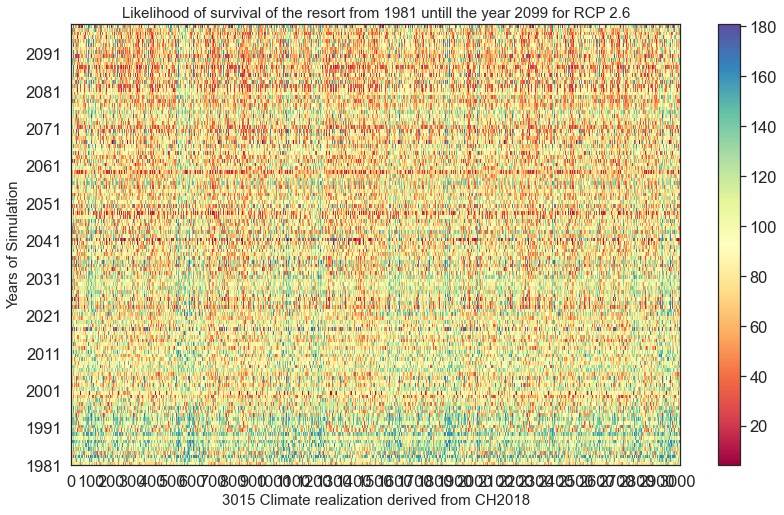

In [124]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

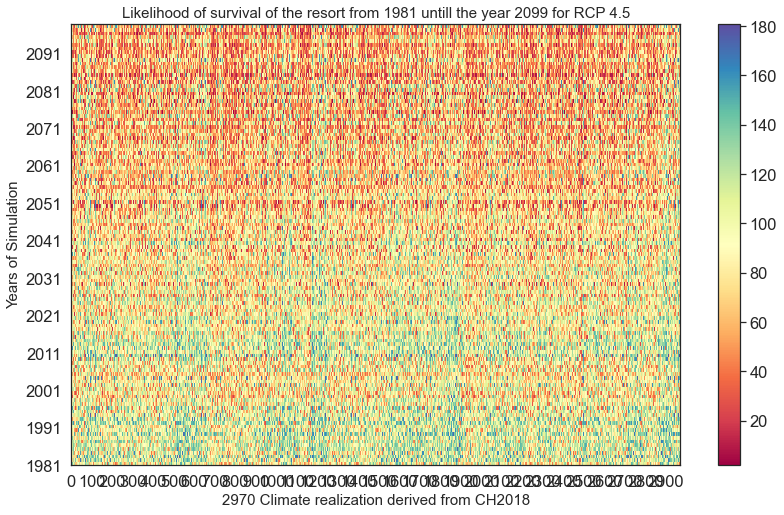

In [125]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

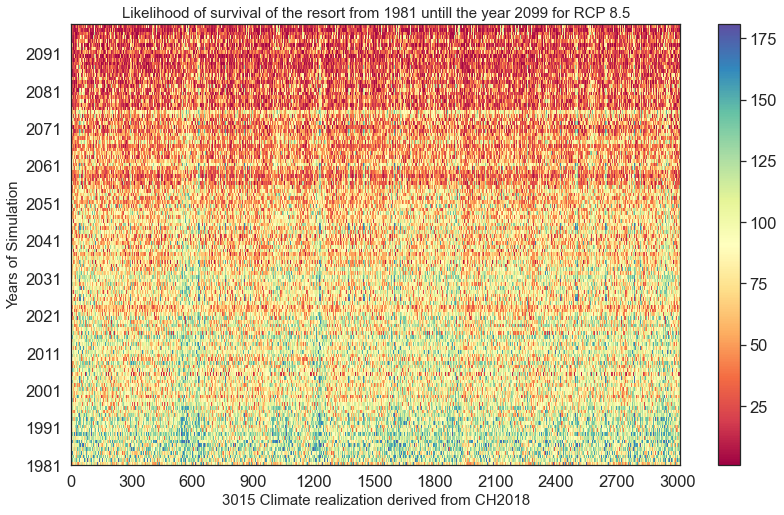

In [126]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [127]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [128]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [129]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [130]:
df26_all.shape

(118, 3016)

In [131]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [132]:
type(df26_all)

pandas.core.frame.DataFrame

In [133]:
thresholds_85_sce_m

array([  1,   2,   3, ..., 188, 192, 195], dtype=int64)

In [134]:
thresholds_45_sce_m

array([ 10,  11,  13, ..., 194, 196, 199], dtype=int64)

In [135]:
df26_allColumns = df26_all.columns

In [136]:
df26_all[df26_allColumns[1]].iloc[0]

'58.946384615384645'

In [137]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_5'],sc_2_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3_['isOverSnow_sc_26_5'],sc_4_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_26_7'],sc_6_['isOverSnow_sc_26_9'],sc_7_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_sc_26_7'],sc_10_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_11_['isOverSnow_sc_26_7'],sc_12_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_14_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_15_['isOverSnow_sc_26_1'],sc_16_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_17_['isOverSnow_sc_26_1'],sc_18_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_19_['isOverSnow_sc_26_7'],sc_20_['isOverSnow_sc_26_4'],sc_21_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_22_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_26_2'],sc_24_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_25_['isOverSnow_sc_26_12'],sc_26_['isOverSnow_sc_26_8'],sc_27_['isOverSnow_sc_26_8'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_30_['isOverSnow_sc_26_9'],sc_31_['isOverSnow_sc_26_4'],sc_32_['isOverSnow_sc_26_6'],sc_33_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2982_['isOverSnow_sc_26_5'],sc_2983_['isOverSnow_sc_26_9'],sc_2984_['isOverSnow_sc_26_10'],sc_2985_['isOverSnow_sc_26_2'],sc_2986_['isOverSnow_sc_26_8'],sc_2987_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2988_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2989_['isOverSnow_sc_26_4'],sc_2990_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['isOverSnow_sc_26_11'],sc_2992_['isOverSnow_sc_26_10'],sc_2993_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2994_['isOverSnow_sc_26_2'],sc_2995_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2996_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2997_['isOverSnow_sc_26_10'],sc_2998_['isOverSnow_sc_26_3'],sc_2999_['isOverSnow_sc_26_2'],sc_3000_['isOverSnow_sc_26_9'],sc_3001_['isOverSnow_sc_26_5'],sc_3002_['isOverSnow_sc_26_4'],sc_3003_['isOverSnow_sc_26_10'],sc_3004_['isOverSnow_sc_26_12'],sc_3005_['isOverSnow_sc_26_6'],sc_3006_['isOverSnow_sc_26_3'],sc_3007_['isOverSnow_sc_26_5'],sc_3008_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3009_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3010_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_3011_['isOverSnow_sc_26_10'],sc_3012_['isOverSnow_sc_26_5'],sc_3013_['isOverSnow_sc_26_4'],sc_3014_['isOverSnow_sc_26_1'],sc_3015_['isOverSnow_sc_26_7']
0,1981-1982,58.946384615384645,78.08000000000001,56.76318518518518,75.40425925925926,71.17270370370377,100.79811111111111,51.558037037037074,115.66470370370374,81.60733333333343,93.95185185185193,74.95903703703702,46.992444444444416,80.26766666666671,72.83222222222217,77.85784615384608,76.6907407407407,77.44103703703708,84.7696296296295,75.47696296296293,44.18614814814817,88.26307692307685,89.97270370370374,115.18288888888893,95.4104814814816,79.64181481481488,87.58140740740737,87.44644444444448,93.23392592592593,74.43940740740737,95.87825925925928,44.70951851851851,83.47574074074079,48.28096296296299,...,61.720666666666645,137.75554166666666,44.50112499999997,129.1611666666667,110.86291666666669,63.31875000000002,76.35650000000003,49.947708333333345,71.61612499999998,83.28441666666667,47.080791666666656,95.18792307692308,128.57525000000004,55.329583333333346,78.36269230769231,39.82604166666663,101.17687500000001,133.35966666666667,106.89416666666666,98.37066666666665,47.39670833333336,71.97550000000008,101.664375,62.41187499999995,94.31275,94.16016666666664,80.29954166666667,103.43995833333334,69.47633333333333,45.625499999999995,63.34079166666663,75.38633333333333,84.70066666666663,89.38420833333329
1,1982-1983,96.56430769230765,87.6397692307692,92.98785185185184,75.57048148148144,118.13344444444445,108.0107037037037

In [138]:
thresholds_45_sce_m.shape

(2970,)

In [139]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
60.0
0
62


In [140]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [141]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [142]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [143]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

1126
669
277


In [144]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

1126
669
277


In [145]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

1126
669
277


In [146]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
2971
3016


In [147]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
2970
3015


In [148]:
type(T1RCP85)

numpy.ndarray

In [149]:
T1RCP85.shape

(3016,)

In [150]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [151]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [152]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,2.0,0,4,3.0,0.0,13.0,8.0,0.0,7.0
1,1.0,0,12,4.0,0.0,14.0,4.0,0.0,73.0
2,7.0,0,23,8.0,0.0,16.0,9.0,0.0,79.0
3,0.0,0,25,2.0,0.0,20.0,9.0,0.0,90.0
4,5.0,0,27,7.0,0.0,22.0,7.0,0.0,98.0
5,3.0,0,29,8.0,0.0,26.0,6.0,0.0,106.0
6,7.0,0,34,4.0,0.0,28.0,5.0,0.0,124.0
7,6.0,0,36,1.0,0.0,32.0,9.0,0.0,129.0
8,6.0,0,37,0.0,0.0,40.0,7.0,0.0,131.0
9,1.0,0,41,7.0,0.0,48.0,4.0,0.0,140.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [153]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [154]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3015
The lengthe of X is: 3015


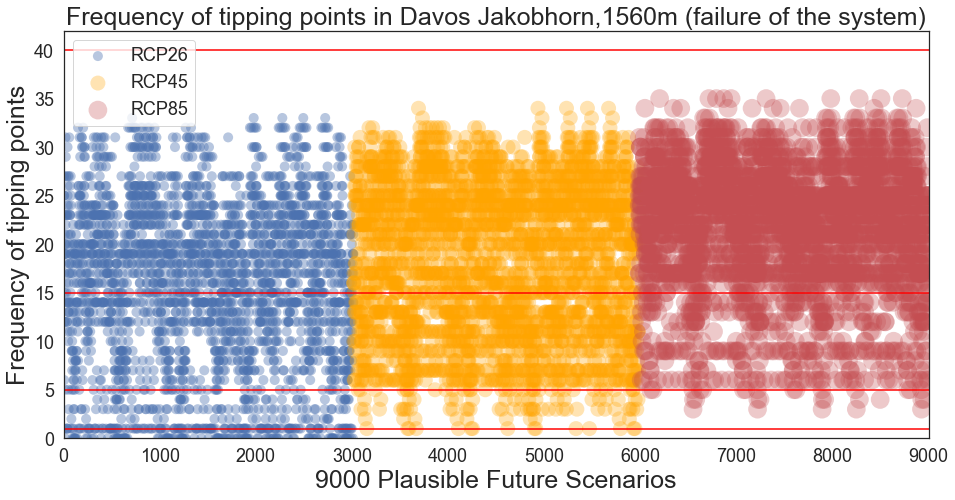

In [155]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

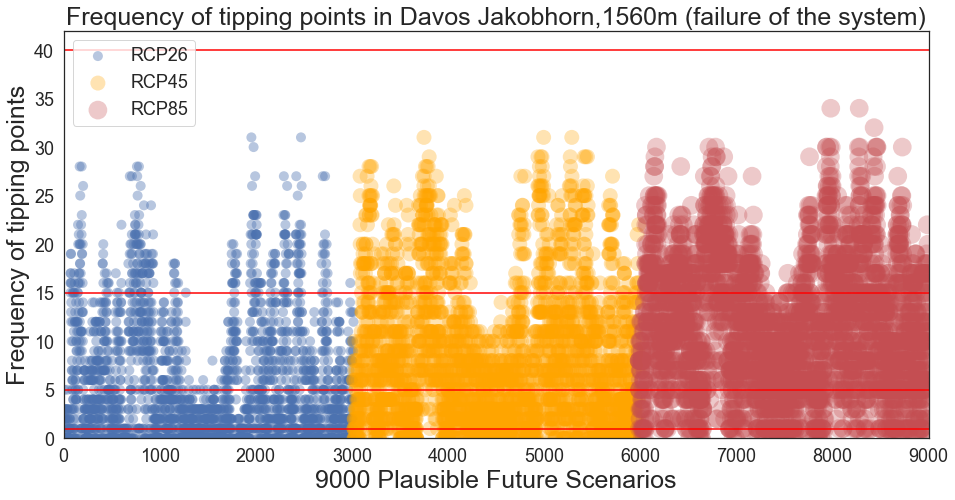

In [156]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

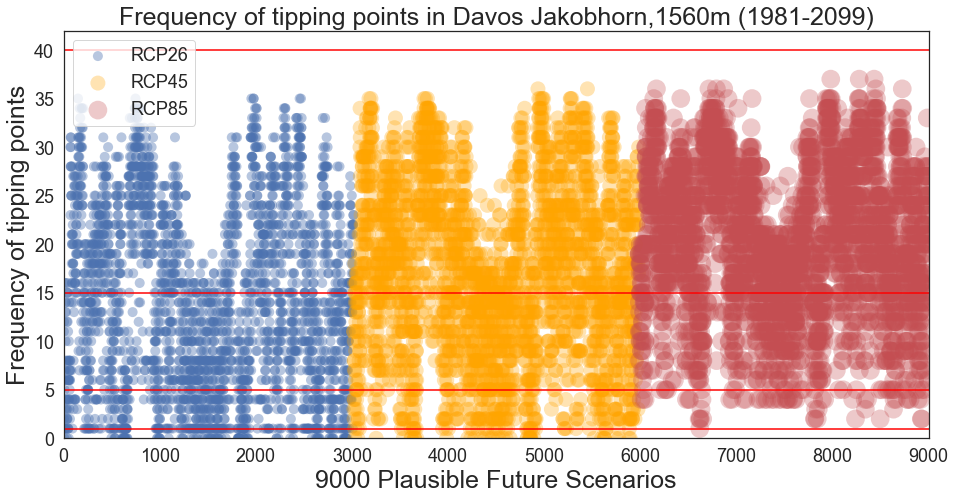

In [157]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [158]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,260.0,60.0,1,0,UZHModel,66.113741,37,91.765769,86.574077,76.347231,125.294346,122.818731,139.230231,124.633731,64.228923,143.137231,99.761154,106.665769,72.637577,86.568231,57.357115,103.274154,108.509923,99.088462,73.972538,80.161654,111.892923,...,37.796692,4.499115,16.362731,51.471269,62.015423,43.962808,78.623154,45.278923,58.152692,36.941577,42.713077,22.433462,25.415038,78.482192,10.410615,33.927923,24.569462,16.812538,55.367115,41.045846,37.304423,17.570423,17.967808,17.808769,13.941769,41.854462,34.170769,48.615154,21.851654,29.929577,70.105254,2.670763,0.688093,14.0
201,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,100.0,1,1,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.108704,136.858333,121.567037,61.850074,140.879481,96.291778,104.663481,69.947296,83.362000,55.232778,100.572185,105.529852,97.306815,71.232815,77.192704,109.712630,...,36.396815,4.332481,15.756704,49.714852,59.726111,42.334556,76.797593,43.601926,55.998889,35.573370,41.131111,21.602593,24.473741,76.809370,10.025037,32.671333,23.659481,16.189852,53.316481,39.525630,35.922778,16.919667,17.302333,17.149185,13.425407,40.304296,32.905185,46.925704,21.042333,28.821074,70.105254,2.535339,0.516609,25.0
401,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,100.0,1,2,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.108704,136.858333,121.567037,61.850074,140.879481,96.291778,104.663481,69.947296,83.362000,55.232778,100.572185,105.529852,97.306815,71.232815,77.192704,109.712630,...,36.396815,4.332481,15.756704,49.714852,59.726111,42.334556,76.797593,43.601926,55.998889,35.573370,41.131111,21.602593,24.473741,76.809370,10.025037,32.671333,23.659481,16.189852,53.316481,39.525630,35.922778,16.919667,17.302333,17.149185,13.425407,40.304296,32.905185,46.925704,21.042333,28.821074,70.105254,2.535339,0.516609,25.0
601,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,200.0,70.0,1,3,UZHModel,78.127984,37,109.687700,103.190550,98.754050,138.341350,131.245750,149.892450,134.177550,83.497600,157.065700,114.395200,117.628100,94.428850,109.163000,73.627000,118.427600,119.924550,110.184600,95.194450,97.832800,122.183200,...,47.406350,5.848850,21.271550,63.293850,78.339950,57.151650,91.092300,58.028650,75.184850,48.024050,55.524800,29.163500,33.039550,86.115350,13.533800,44.106300,31.940300,21.856300,71.316250,53.359600,48.495750,22.841550,23.358150,23.151400,18.124300,54.410800,44.422000,60.912300,28.407150,38.440700,70.105254,4.039407,0.712341,11.0
801,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,240.0,80.0,1,4,UZHModel,69.849349,37,97.698875,91.599125,82.709500,129.041750,125.417708,142.453958,129.264250,69.581333,147.954042,106.476458,110.616250,78.690708,93.782250,62.095583,108.250708,113.216667,102.602375,80.136917,86.329458,116.152792,...,40.946417,4.874042,17.726292,55.202958,66.908917,47.626375,82.675083,49.052167,62.998750,40.020042,46.272500,24.302917,27.532958,81.170958,11.278167,36.755250,26.616917,18.213583,59.981042,44.466333,40.413125,19.034625,19.465125,19.292833,15.103583,45.342333,37.018333,52.338417,23.672625,32.423708,70.105254,2.967627,0.628466,17.0
1001,1.565489,1005.182413,5.597953,-1.941324,2.755879,0.040051,3.0,270.0,80.0,1,5,UZHModel,64.307003,37,88.663333,84.139370,73.519556,123.317481,121.1

In [232]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [159]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

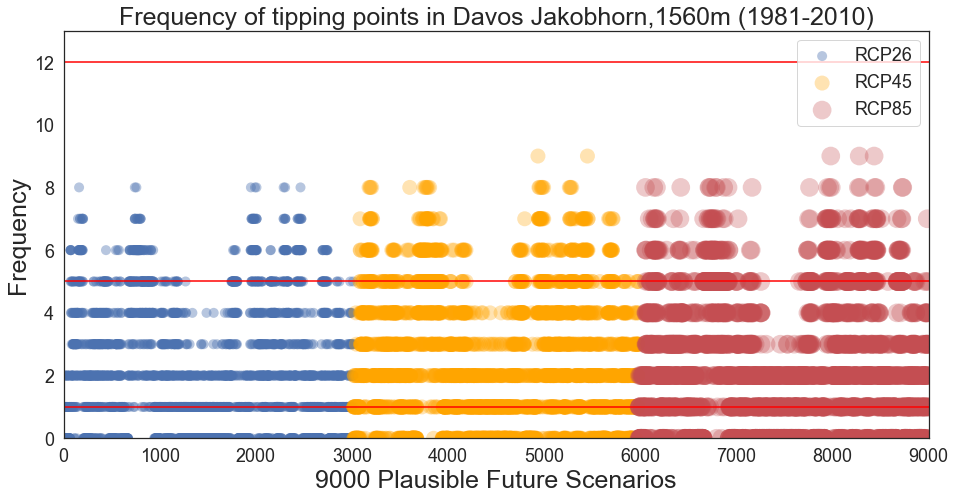

In [160]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [161]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [162]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [233]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [164]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    909
2.0    528
1.0    523
4.0    287
3.0    283
5.0    277
6.0    153
7.0     47
8.0      9
Name: tippingPoint26_1980, dtype: int64
1.0    635
0.0    635
2.0    490
3.0    364
4.0    361
5.0    233
6.0    161
7.0     69
8.0     21
9.0      2
Name: tippingPoint45_1980, dtype: int64
0.0    745
1.0    608
2.0    597
3.0    350
5.0    270
4.0    213
6.0    143
7.0     65
8.0     22
9.0      3
Name: tippingPoint85_1980, dtype: int64


In [165]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    908
2.0    528
1.0    523
4.0    287
3.0    283
5.0    277
6.0    153
7.0     47
8.0      9
Name: tippingPoint26_1_1980, dtype: int64
1.0    635
0.0    634
2.0    490
3.0    364
4.0    361
5.0    233
6.0    161
7.0     69
8.0     21
9.0      2
Name: tippingPoint45_1_1980, dtype: int64
0.0    744
1.0    608
2.0    597
3.0    350
5.0    270
4.0    213
6.0    143
7.0     65
8.0     22
9.0      3
Name: tippingPoint85_1_1980, dtype: int64


In [166]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario45_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
1

In [167]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

197    45
100    45
186    45
178    45
174    45
172    45
170    45
160    45
150    45
144    45
142    45
128    45
116    45
114    45
112    45
104    45
96     45
198    45
88     45
84     45
74     45
66     45
64     45
58     45
50     45
46     45
44     45
36     45
34     45
12     45
8      45
4      45
190    45
17     45
193    45
111    45
191    45
189    45
187    45
183    45
181    45
179    45
175    45
169    45
165    45
155    45
143    45
137    45
127    45
119    45
105    45
23     45
95     45
91     45
83     45
81     45
65     45
61     45
55     45
45     45
43     45
41     45
37     45
29     45
27     45
25     45
0      45
Name: policy26_1980, dtype: int64
199    45
82     45
176    45
168    45
164    45
162    45
156    45
138    45
136    45
134    45
130    45
126    45
122    45
120    45
118    45
86     45
76     45
185    45
70     45
68     45
54     45
52     45
48     45
40     45
38     45
32     45
28     45
26     45
22     45
20    

In [237]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

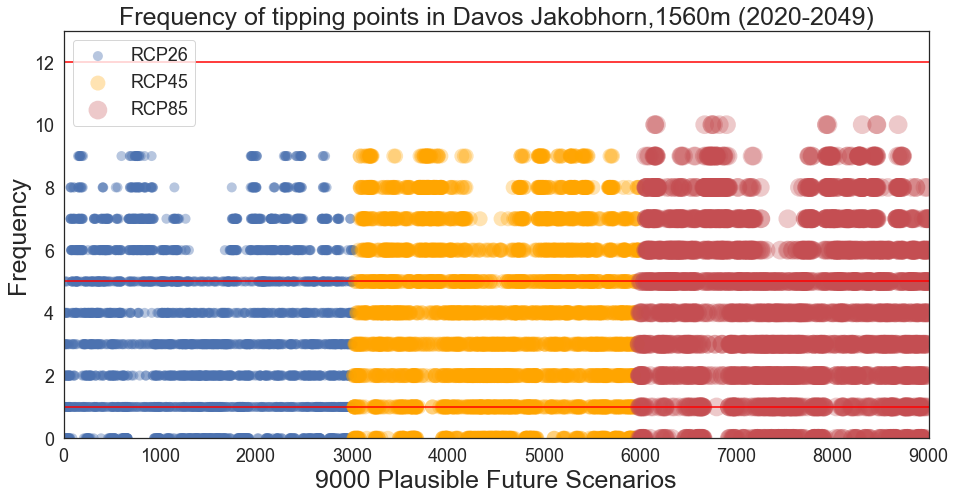

In [238]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [239]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [240]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [241]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

0.0    435
3.0    400
2.0    395
1.0    379
5.0    354
6.0    322
4.0    297
7.0    280
8.0     97
9.0     57
Name: tippingPoint26_2020, dtype: int64
4.0    374
1.0    359
0.0    351
2.0    337
3.0    336
5.0    307
6.0    296
7.0    271
8.0    241
9.0     99
Name: tippingPoint45_2020, dtype: int64
6.0     398
3.0     389
5.0     376
7.0     319
2.0     318
4.0     285
0.0     280
1.0     266
8.0     256
9.0     113
10.0     16
Name: tippingPoint85_2020, dtype: int64


In [242]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

0.0    434
3.0    400
2.0    395
1.0    379
4.0    297
Name: tippingPoint26_1_2020, dtype: int64
4.0    374
1.0    359
0.0    350
2.0    337
3.0    336
Name: tippingPoint45_1_2020, dtype: int64
3.0    389
2.0    318
4.0    285
0.0    279
1.0    266
Name: tippingPoint85_1_2020, dtype: int64


In [243]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

9     67
27    66
39    65
0     64
14    64
24    64
20    63
22    63
43    62
21    62
23    62
7     61
41    59
28    59
18    58
19    58
3     57
35    55
37    55
33    52
16    50
38    50
44    49
25    48
31    46
4     43
42    43
5     35
8     33
15    31
30    30
1     27
17    26
32    20
6     17
40    17
10    16
29    15
12    14
13    14
34    14
26    14
2     13
36    13
11    11
Name: scenario26_2020, dtype: int64
39    65
9     65
22    64
27    64
0     62
20    61
14    61
23    59
28    58
21    58
43    58
41    58
7     57
24    57
18    55
19    55
35    52
3     52
16    50
38    49
33    47
25    44
31    41
37    41
42    39
44    37
4     34
15    33
5     31
8     28
17    25
1     25
30    25
6     23
32    16
26    15
12    15
40    14
10    12
13    11
34     9
36     9
2      9
29     7
11     6
Name: scenario45_2020, dtype: int64
39    67
27    66
9     66
22    63
14    61
20    61
0     61
43    59
41    58
21    58
23    57
19    54
28    54
2

In [244]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

193    34
127    33
172    32
91     32
179    31
96     31
83     31
66     31
170    31
44     31
0      31
23     31
41     30
160    30
8      30
128    30
43     30
64     30
25     30
58     30
112    30
181    30
105    30
61     29
74     29
36     29
17     29
12     29
197    29
198    29
178    29
150    29
116    29
142    29
169    29
190    29
143    29
155    29
174    28
46     28
29     28
111    28
55     28
37     28
100    28
65     27
81     27
84     27
27     27
186    27
34     27
119    27
144    27
187    26
183    26
165    26
45     26
4      26
95     26
137    26
175    25
50     25
191    25
114    23
189    23
88     23
104    23
Name: policy26_2020, dtype: int64
59     33
156    31
180    31
161    31
21     30
86     30
31     29
57     29
126    29
67     29
120    29
85     29
182    29
14     29
13     29
89     28
32     28
153    28
77     28
136    28
134    28
130    28
11     28
40     28
196    27
76     27
123    27
48     27
135    27
28    

In [245]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

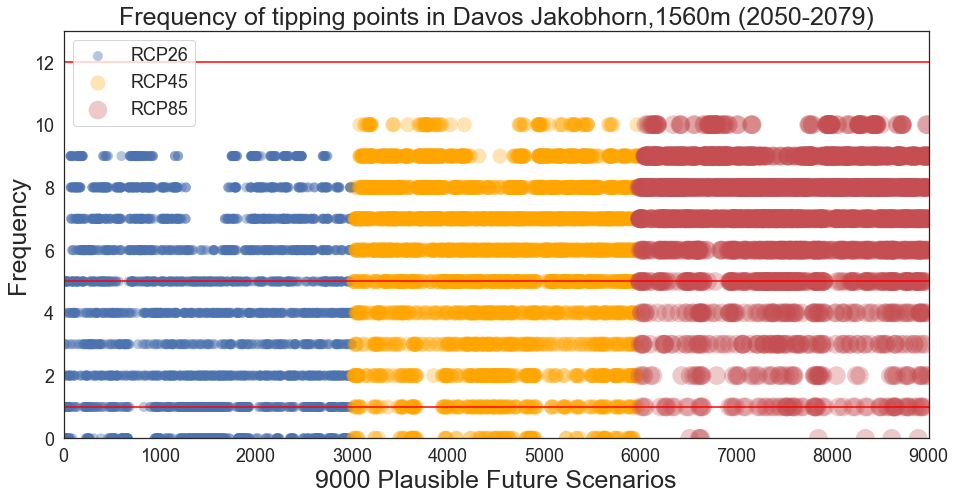

In [246]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [247]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [248]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [249]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

0.0    402
1.0    359
5.0    348
2.0    340
4.0    304
6.0    290
8.0    284
7.0    276
3.0    211
9.0    202
Name: tippingPoint26_2050, dtype: int64
7.0     476
6.0     413
9.0     401
8.0     393
5.0     311
4.0     230
2.0     214
3.0     183
1.0     161
0.0     109
10.0     80
Name: tippingPoint45_2050, dtype: int64
9.0     869
8.0     592
7.0     510
6.0     308
5.0     250
10.0    123
4.0     113
3.0     104
1.0      76
2.0      62
0.0       9
Name: tippingPoint85_2050, dtype: int64


In [250]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

0.0    401
1.0    359
2.0    340
4.0    304
3.0    211
Name: tippingPoint26_1_2050, dtype: int64
4.0    230
2.0    214
3.0    183
1.0    161
0.0    108
Name: tippingPoint45_1_2050, dtype: int64
4.0    113
3.0    104
1.0     76
2.0     62
0.0      8
Name: tippingPoint85_1_2050, dtype: int64


In [251]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

9     66
39    64
27    62
14    61
43    55
24    55
22    54
19    54
20    54
0     54
23    53
41    52
21    52
7     50
28    47
18    47
35    46
3     44
37    42
33    42
31    40
25    39
16    39
38    38
42    36
44    34
4     31
15    27
8     27
17    26
30    26
5     25
1     22
32    19
12    16
6     16
13    15
40    14
10    13
26    13
34    12
29    11
36     9
2      7
11     6
Name: scenario26_2050, dtype: int64
27    43
39    41
9     41
22    38
0     38
20    37
28    35
21    35
23    34
14    34
41    34
43    34
18    33
24    31
7     29
19    28
3     27
35    23
37    22
16    20
38    19
44    18
33    17
25    16
31    15
4     15
17    12
42    12
8     12
15    11
6     10
1      9
30     9
26     8
5      8
12     7
32     6
2      5
11     5
34     5
29     5
40     5
36     4
10     3
13     3
Name: scenario45_2050, dtype: int64
9     28
27    26
39    20
43    17
0     16
22    15
41    14
20    14
28    13
14    13
24    12
21    12
23    11
1

In [252]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

105    32
41     31
160    28
169    28
181    27
36     27
174    27
175    27
150    27
172    27
186    27
25     27
17     27
66     26
127    26
142    26
143    26
91     26
84     26
178    26
45     25
155    25
144    25
100    25
112    25
193    25
64     24
111    24
0      24
119    24
128    24
137    24
29     24
170    24
179    24
183    24
4      24
83     24
43     23
61     23
12     23
198    23
190    23
189    23
81     23
165    23
88     23
191    22
58     22
8      22
50     22
96     22
197    22
65     22
187    22
116    22
34     22
114    22
27     21
104    21
37     21
46     21
55     21
95     21
23     20
44     20
74     18
Name: policy26_2050, dtype: int64
168    19
57     19
167    19
97     18
185    18
28     18
125    18
13     17
70     17
176    17
85     17
11     17
86     17
138    16
32     16
14     16
31     16
162    15
156    15
49     15
69     15
120    14
123    14
103    14
122    14
68     14
54     14
48     14
180    14
182   

In [253]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

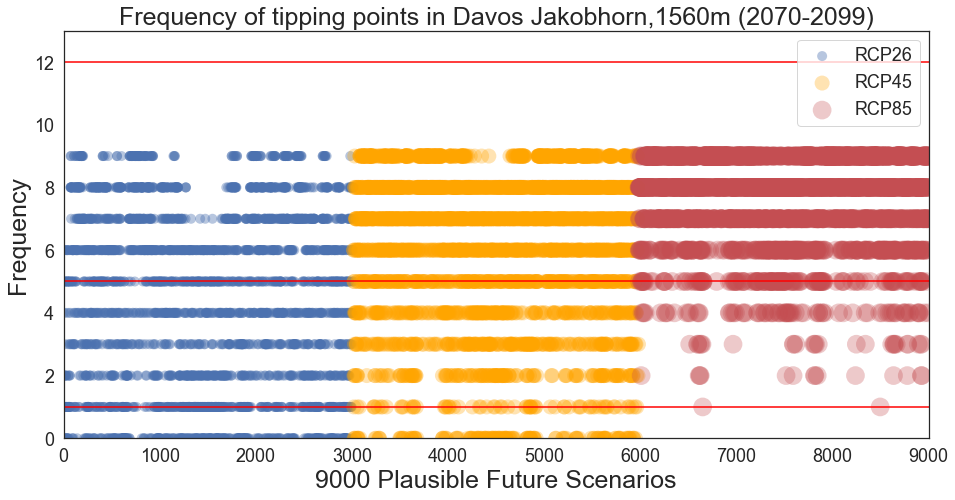

In [254]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [255]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [256]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [257]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

6.0    398
8.0    387
1.0    371
7.0    340
0.0    339
5.0    293
4.0    274
2.0    248
3.0    207
9.0    159
Name: tippingPoint26_2070, dtype: int64
8.0    559
7.0    491
9.0    488
6.0    374
5.0    258
4.0    220
3.0    216
2.0    148
0.0    146
1.0     71
Name: tippingPoint45_2070, dtype: int64
9.0    1266
8.0     752
7.0     443
6.0     284
5.0     150
4.0      78
3.0      26
2.0      14
1.0       2
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [258]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

1.0    371
0.0    338
4.0    274
2.0    248
3.0    207
Name: tippingPoint26_1_2070, dtype: int64
4.0    220
3.0    216
2.0    148
0.0    145
1.0     71
Name: tippingPoint45_1_2070, dtype: int64
4.0    78
3.0    26
2.0    14
1.0     2
Name: tippingPoint85_1_2070, dtype: int64


In [259]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

9     64
27    61
39    55
24    50
22    48
20    48
0     46
14    45
19    45
21    45
43    45
41    44
7     43
23    42
35    41
18    39
31    39
3     38
28    38
33    37
25    37
37    36
38    35
16    34
42    30
44    29
4     27
15    26
17    25
30    22
5     22
8     21
1     20
34    15
6     14
32    14
40    14
12    14
36    14
29    14
10    13
13    13
2     13
26    12
11    11
Name: scenario26_2070, dtype: int64
9     38
39    35
27    34
22    33
0     33
20    32
14    32
43    30
23    29
21    28
41    28
24    27
28    27
18    26
19    25
7     25
3     23
35    20
37    20
16    20
33    19
38    17
44    17
31    16
25    15
4     14
15    13
42    13
8     11
17    10
5     10
6      9
1      8
30     7
12     7
26     7
34     6
2      5
40     5
11     5
29     5
13     4
36     4
32     4
10     4
Name: scenario45_2070, dtype: int64
9     12
27    10
39    10
43     9
41     8
23     7
14     6
22     6
0      5
7      4
19     3
33     3
4      3
2

In [260]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

105    32
41     27
160    26
142    25
143    25
150    25
25     25
186    25
46     24
91     24
119    24
17     24
36     24
181    24
183    24
172    23
43     23
112    23
8      23
4      23
193    23
128    23
127    22
100    22
84     22
45     22
137    22
178    22
144    22
169    22
170    22
174    22
50     21
189    21
64     21
65     21
66     21
179    21
83     21
175    21
88     21
27     21
95     21
34     21
111    21
114    21
0      21
12     20
198    20
191    20
190    20
165    20
55     19
58     19
187    19
23     19
29     19
44     19
61     19
197    18
81     18
104    18
155    17
96     16
116    16
37     14
74     14
Name: policy26_2070, dtype: int64
86     18
167    18
57     17
168    17
125    16
70     16
176    16
14     16
28     15
13     15
138    15
69     15
97     15
32     15
185    15
11     15
89     14
180    14
49     14
162    13
122    13
103    13
31     13
120    13
126    13
123    13
85     12
77     12
48     12
54    

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [208]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [209]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [210]:
max_scenario.to_numpy()

array([99.4165    , 99.73311111, 99.87411538, 99.79686667, 99.94569231,
       99.97053333, 98.87003704, 99.90973077, 99.726     , 99.96063333,
       99.74495455, 99.79307143, 99.73953333, 99.7619    , 99.83319231,
       99.8295    , 99.94236364, 99.99737037, 99.82988889, 99.91214815,
       99.9365    , 99.90739286, 99.98018182, 99.84433333, 99.72282143,
       99.824125  , 99.98276667, 99.97925   , 99.86896552, 99.99463636,
       99.86568   , 99.99778571, 99.86967857, 99.98545833, 99.88726923,
       99.93288   , 99.89240741, 99.86375   , 99.84704545, 99.85954167,
       99.73826923, 99.99192593, 99.57759091, 99.92048   , 99.46765   ,
       99.81468966, 99.60455556, 99.92406897, 99.91617857, 99.98623333,
       99.91275   , 99.92372727, 99.88676   , 99.69577273, 99.99386667,
       99.97042857, 99.98070833, 99.9322    , 99.95096154, 99.8728    ,
       99.9185    , 99.99948276, 98.38969231, 99.76216   , 99.98415385,
       99.53865   , 99.933     , 99.85518519, 99.82334615, 99.93

In [211]:
min_scenario.to_numpy()

array([100.41833333, 100.0473    , 101.16395833, 100.466375  ,
       100.10908   , 100.10896   , 100.01846429, 100.03928   ,
       100.029375  , 100.0207    , 100.05932143, 100.02845455,
       100.49406667, 100.04359259, 100.028     , 100.10266667,
       100.38027273, 100.15307143, 100.17509091,  10.078375  ,
       100.13718519, 100.10942857, 100.04236364, 100.11629167,
       100.00686207, 100.04813636, 100.09003448, 100.09423333,
       100.21068966, 100.02433333, 100.10762963, 100.01709091,
       100.03656   , 100.00653846, 100.00155172, 100.16676923,
       100.05546429, 100.00060714, 100.129     , 100.52033333,
       100.03488   , 100.00865385, 100.00442857, 100.54726923,
        10.7218    , 100.03959259, 100.06184615, 100.00065   ,
       100.07992857, 100.49865   , 100.88906897, 100.06616667,
       100.08376667, 100.61906897, 100.02608   , 100.02426667,
       100.0847931 , 100.1503    , 100.41675862,  10.30254167,
        10.1373    , 100.19382759, 100.36640741, 100.11

In [212]:
max_scenario.shape

(118,)

## Changes in Good Days

In [213]:
max_scenario.to_numpy()

array([99.4165    , 99.73311111, 99.87411538, 99.79686667, 99.94569231,
       99.97053333, 98.87003704, 99.90973077, 99.726     , 99.96063333,
       99.74495455, 99.79307143, 99.73953333, 99.7619    , 99.83319231,
       99.8295    , 99.94236364, 99.99737037, 99.82988889, 99.91214815,
       99.9365    , 99.90739286, 99.98018182, 99.84433333, 99.72282143,
       99.824125  , 99.98276667, 99.97925   , 99.86896552, 99.99463636,
       99.86568   , 99.99778571, 99.86967857, 99.98545833, 99.88726923,
       99.93288   , 99.89240741, 99.86375   , 99.84704545, 99.85954167,
       99.73826923, 99.99192593, 99.57759091, 99.92048   , 99.46765   ,
       99.81468966, 99.60455556, 99.92406897, 99.91617857, 99.98623333,
       99.91275   , 99.92372727, 99.88676   , 99.69577273, 99.99386667,
       99.97042857, 99.98070833, 99.9322    , 99.95096154, 99.8728    ,
       99.9185    , 99.99948276, 98.38969231, 99.76216   , 99.98415385,
       99.53865   , 99.933     , 99.85518519, 99.82334615, 99.93

In [214]:
max_scenario.shape

(118,)

In [215]:
min_scenario.to_numpy()

array([100.41833333, 100.0473    , 101.16395833, 100.466375  ,
       100.10908   , 100.10896   , 100.01846429, 100.03928   ,
       100.029375  , 100.0207    , 100.05932143, 100.02845455,
       100.49406667, 100.04359259, 100.028     , 100.10266667,
       100.38027273, 100.15307143, 100.17509091,  10.078375  ,
       100.13718519, 100.10942857, 100.04236364, 100.11629167,
       100.00686207, 100.04813636, 100.09003448, 100.09423333,
       100.21068966, 100.02433333, 100.10762963, 100.01709091,
       100.03656   , 100.00653846, 100.00155172, 100.16676923,
       100.05546429, 100.00060714, 100.129     , 100.52033333,
       100.03488   , 100.00865385, 100.00442857, 100.54726923,
        10.7218    , 100.03959259, 100.06184615, 100.00065   ,
       100.07992857, 100.49865   , 100.88906897, 100.06616667,
       100.08376667, 100.61906897, 100.02608   , 100.02426667,
       100.0847931 , 100.1503    , 100.41675862,  10.30254167,
        10.1373    , 100.19382759, 100.36640741, 100.11

In [216]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [217]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =95.16 days
Uncertainty Band2 =95.16 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.67 days
Uncertainty Band2 =96.67 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.18 days
Uncertainty Band2 =95.18 days
****************************************End



In [218]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =90.68 days
Uncertainty Band2 =90.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =88.43 days
Uncertainty Band2 =88.43 days
****************************************End

Start************************************************************
Uncertainty Band1 =90.65 days
Uncertainty Band2 =90.65 days
****************************************End



In [219]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =95.18 days
Uncertainty Band2 =95.18 days
****************************************End

Start************************************************************
Uncertainty Band1 =78.56 days
Uncertainty Band2 =78.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =65.69 days
Uncertainty Band2 =65.70 days
****************************************End



In [220]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =84.80 days
Uncertainty Band2 =84.92 days
****************************************End

Start************************************************************
Uncertainty Band1 =63.62 days
Uncertainty Band2 =63.62 days
****************************************End

Start************************************************************
Uncertainty Band1 =48.84 days
Uncertainty Band2 =48.84 days
****************************************End



## Changes in Financial situation

In [221]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [222]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [223]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =4.47 days
Uncertainty Band2 =4.47 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.53 days
Uncertainty Band2 =4.53 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.60 days
Uncertainty Band2 =4.60 days
****************************************End



In [224]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =4.34 days
Uncertainty Band2 =4.34 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.13 days
Uncertainty Band2 =4.12 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.05 days
Uncertainty Band2 =4.04 days
****************************************End



In [225]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =4.10 days
Uncertainty Band2 =4.10 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.94 days
Uncertainty Band2 =3.94 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.47 days
Uncertainty Band2 =3.47 days
****************************************End



In [226]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.91 days
Uncertainty Band2 =3.91 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.61 days
Uncertainty Band2 =3.61 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.86 days
Uncertainty Band2 =2.86 days
****************************************End



## Changes in Artificial Snow

In [227]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [228]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =96.73 days
Uncertainty Band2 =96.73 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.64 days
Uncertainty Band2 =96.64 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.67 days
Uncertainty Band2 =96.67 days
****************************************End



In [229]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =96.65 days
Uncertainty Band2 =96.64 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.92 days
Uncertainty Band2 =96.91 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.01 days
Uncertainty Band2 =96.01 days
****************************************End



In [230]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =96.14 days
Uncertainty Band2 =96.15 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.26 days
Uncertainty Band2 =89.36 days
****************************************End

Start************************************************************
Uncertainty Band1 =67.67 days
Uncertainty Band2 =67.53 days
****************************************End



In [231]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =89.96 days
Uncertainty Band2 =89.96 days
****************************************End

Start************************************************************
Uncertainty Band1 =81.49 days
Uncertainty Band2 =81.48 days
****************************************End

Start************************************************************
Uncertainty Band1 =45.00 days
Uncertainty Band2 =45.02 days
****************************************End



## End